## Some Beginner Level Exploratory Data Analysis

In [26]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("ReadParquetExample") \
    .getOrCreate()

df_final = spark.read.parquet("final_dataset_parquet/")
df_final.printSchema()
print(f"Number of rows: {df_final.count()}")

root
 |-- Cameo: string (nullable = true)
 |-- Cameo_full: string (nullable = true)
 |-- GLOBALEVENTID: string (nullable = true)
 |-- SQLDATE: date (nullable = true)
 |-- Actor1Name: string (nullable = true)
 |-- Actor1Geo_FullName: string (nullable = true)
 |-- Actor2Name: string (nullable = true)
 |-- Actor2Geo_FullName: string (nullable = true)
 |-- IsRootEvent: string (nullable = true)
 |-- EventCode: string (nullable = true)
 |-- EventBaseCode: string (nullable = true)
 |-- QuadClass: string (nullable = true)
 |-- GoldsteinScale: double (nullable = true)
 |-- NumMentions: integer (nullable = true)
 |-- NumSources: integer (nullable = true)
 |-- NumArticles: integer (nullable = true)
 |-- AvgTone: double (nullable = true)
 |-- ActionGeo_Type: string (nullable = true)
 |-- ActionGeo_FullName: string (nullable = true)
 |-- ActionGeo_CountryCode: string (nullable = true)
 |-- SOURCEURL: string (nullable = true)
 |-- domain_name: string (nullable = true)
 |-- news_source_country: strin

       SQLDATE  event_count
17  2023-10-18        63522
9   2023-10-10        61745
12  2023-10-13        61401
11  2023-10-12        59343
10  2023-10-11        59089


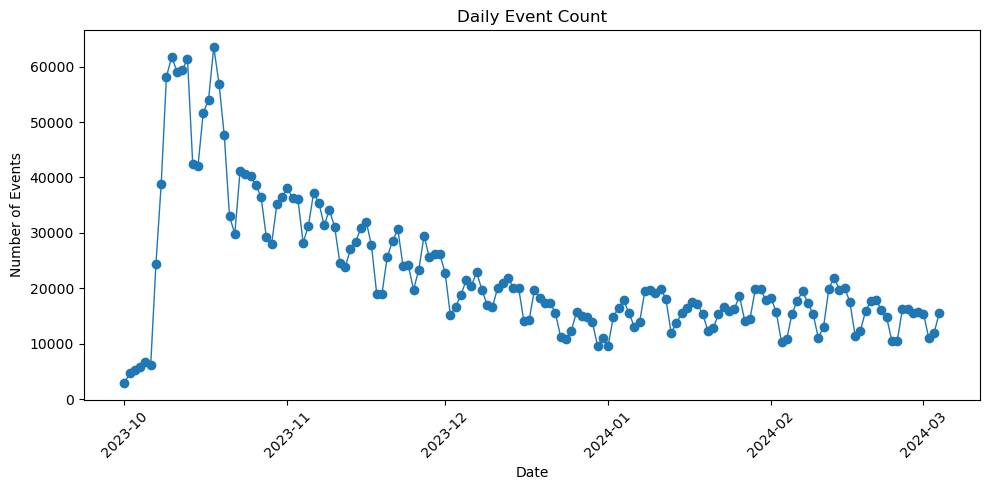

In [10]:
from pyspark.sql.functions import count
import matplotlib.pyplot as plt
import pandas as pd
from pyspark.sql.functions import col, count, sum as _sum

# 1) Aggregate per day
df_filtered = df_final.filter(
    (col("SQLDATE") >= "2023-10-01") &
    (col("SQLDATE") <= "2024-03-31")
)

daily_counts = (
    df_filtered
      .groupBy("SQLDATE")
      .agg(count("*").alias("event_count"))
      .orderBy("SQLDATE")
)

# 2) Convert to pandas
pdf = daily_counts.toPandas()
print(pdf.sort_values(by="event_count", ascending=False).head(5))

# 3) Plot & save
plt.figure(figsize=(10, 5))
plt.plot(pdf["SQLDATE"], pdf["event_count"], marker="o", linewidth=1)
plt.title("Daily Event Count")
plt.xlabel("Date")
plt.ylabel("Number of Events")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
plt.savefig("figures/01_daily_event_count.png", dpi=300)
plt.close()


In [ ]:
## Using prophet to get a smooth trend curve. It is a Bayesian additive regression model.

In [11]:
!pip install prophet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.4/14.4 MB 15.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.5/94.5 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.9/917.9 kB 22.3 MB/s eta 0:00:0000:01


09:09:37 - cmdstanpy - INFO - Chain [1] start processing
09:09:37 - cmdstanpy - INFO - Chain [1] done processing


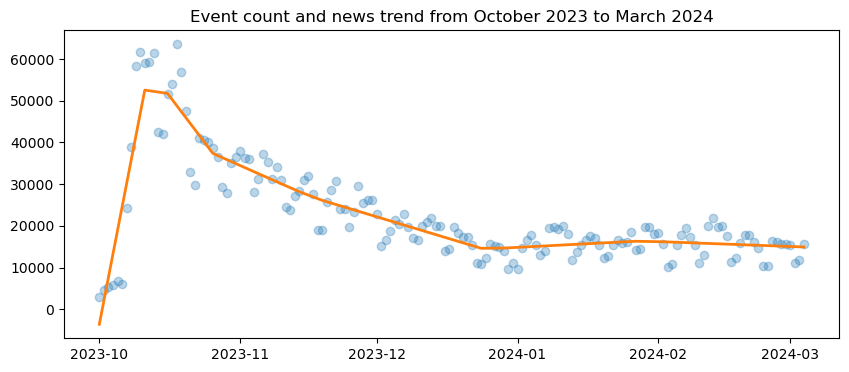

In [13]:
from prophet import Prophet

# Prophet expects columns ds (date) and y (value)
m = Prophet(daily_seasonality=False, weekly_seasonality=True, yearly_seasonality=False,
            changepoint_prior_scale=0.5)
df_prophet = pdf.rename(columns={"SQLDATE":"ds","event_count":"y"})
m.fit(df_prophet)

# predict *on* your existing dates (no future extension)
future = m.make_future_dataframe(periods=0, freq="D")
forecast = m.predict(future)

plt.figure(figsize=(10,4))
plt.plot(pdf.SQLDATE, pdf.event_count, "o", alpha=0.3)
plt.plot(forecast.ds, forecast.trend, "-", lw=2)
plt.title("Event count and news trend from October 2023 to March 2024")
plt.show()


From the above data you can see 2023-10-18 is a special date. In that day there were most amount of news. Let's see what kind of new erupted the world media. Main issue was bombing of Al-Ahli hospital in Gaza. 

In [3]:
from pyspark.sql import functions as F

# 1) Filter to 2023-10-18
df_1018 = df_final.filter(F.col("SQLDATE") == F.lit("2023-10-18"))

# 2) Total count sanity check
total_count = df_1018.count()
print(f"Total events on 2023-10-18: {total_count}")

# 3) Top EventBaseCodes (what types of events)
top_event_types = (
    df_1018
    .groupBy("EventBaseCode")
    .agg(F.count("*").alias("cnt"))
    .orderBy(F.desc("cnt"))
    .limit(10)
)
print("Top 10 EventBaseCodes on 2023-10-18:")
top_event_types.show(truncate=False)

# 4) Top Actor1Name / Actor2Name pairs (who was involved)
actor_pairs = (
    df_1018
    .groupBy("Actor1Name", "Actor2Name")
    .agg(F.count("*").alias("cnt"))
    .orderBy(F.desc("cnt"))
    .limit(10)
)
print("Top 10 Actor1–Actor2 pairs:")
actor_pairs.show(truncate=False)

# 5) Top regions & countries (where)
top_regions = (
    df_1018
    .groupBy("region", "ActionGeo_FullName", "ActionGeo_CountryCode")
    .agg(F.count("*").alias("cnt"))
    .orderBy(F.desc("cnt"))
    .limit(10)
)
print("Top 10 Regions/Countries:")
top_regions.show(truncate=False)

# 6) Top news sources & domains (who reported it)
top_sources = (
    df_1018
    .groupBy("domain_name", "news_source_country")
    .agg(F.count("*").alias("cnt"))
    .orderBy(F.desc("cnt"))
    .limit(10)
)
print("Top 10 Domains / Source Countries:")
top_sources.show(truncate=False)

# 7) Tone & impact summary
tone_impact = df_1018.agg(
    F.count("*").alias("n_events"),
    F.avg("AvgTone").alias("avg_tone"),
    F.min("AvgTone").alias("min_tone"),
    F.max("AvgTone").alias("max_tone"),
    F.avg("GoldsteinScale").alias("avg_goldstein"),
    F.min("GoldsteinScale").alias("min_goldstein"),
    F.max("GoldsteinScale").alias("max_goldstein"),
)
print("Tone & GoldsteinScale summary:")
tone_impact.show(truncate=False)

# 8) Drill into the #1 event type for context (e.g. top 5 sample URLs)
top_base_code = top_event_types.first()["EventBaseCode"]
print(f"Sampling 5 articles for EventBaseCode={top_base_code}:")
(
    df_1018
    .filter(F.col("EventBaseCode") == top_base_code)
    .select("SOURCEURL", "NumMentions", "AvgTone")
    .orderBy(F.desc("NumMentions"))
    .limit(5)
    .show(truncate=False)
)


Total events on 2023-10-18: 63522
Top 10 EventBaseCodes on 2023-10-18:
+-------------+----+
|EventBaseCode|cnt |
+-------------+----+
|042          |4613|
|190          |4285|
|040          |4236|
|043          |4075|
|010          |3300|
|112          |3189|
|111          |3179|
|020          |3108|
|051          |2940|
|036          |2236|
+-------------+----+

Top 10 Actor1–Actor2 pairs:
+-------------+-------------+----+
|Actor1Name   |Actor2Name   |cnt |
+-------------+-------------+----+
|ISRAEL       |ISRAEL       |1363|
|ISRAEL       |NaN          |998 |
|HAMAS        |ISRAEL       |805 |
|ISRAEL       |GAZA         |795 |
|GAZA         |ISRAEL       |755 |
|UNITED STATES|ISRAEL       |685 |
|ISRAEL       |HAMAS        |672 |
|ISRAEL       |PALESTINIAN  |622 |
|PALESTINIAN  |ISRAEL       |616 |
|ISRAEL       |UNITED STATES|446 |
+-------------+-------------+----+

Top 10 Regions/Countries:
+-----------+------------------------------------------------+---------------------+----+

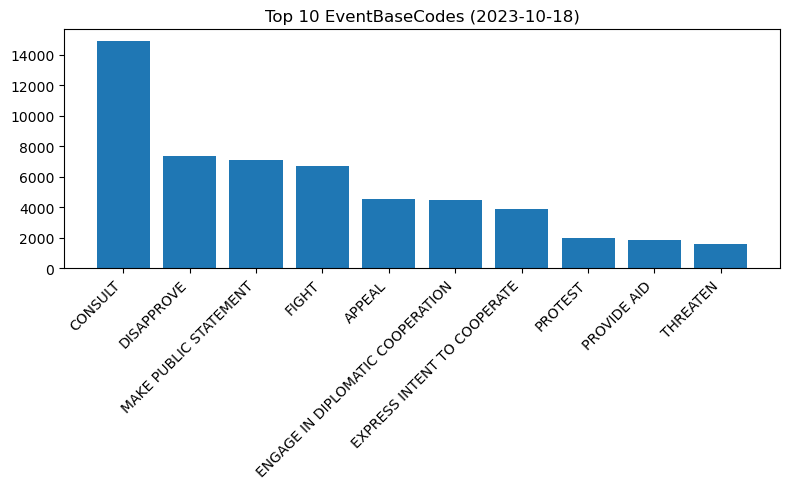

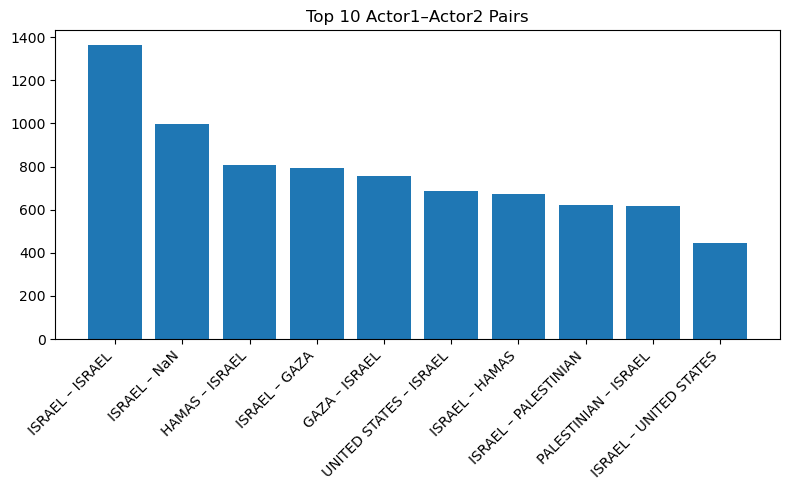

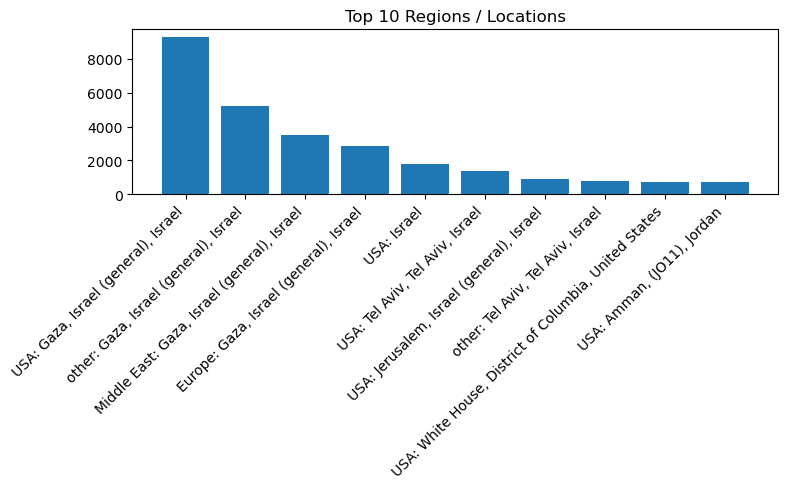

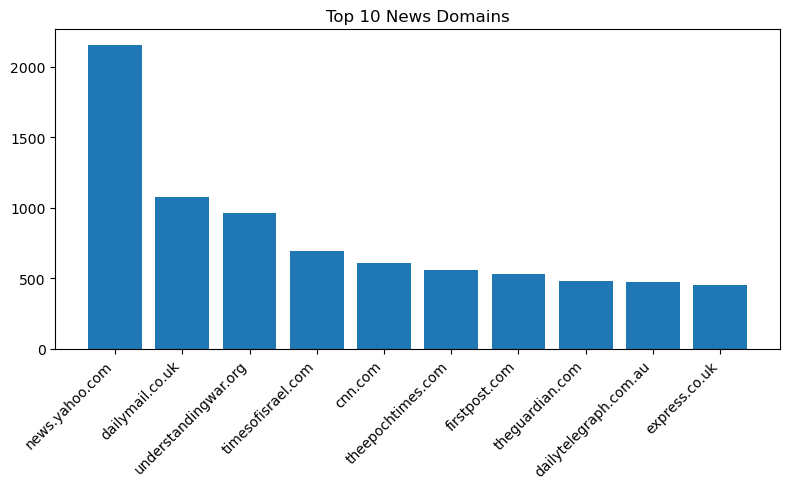

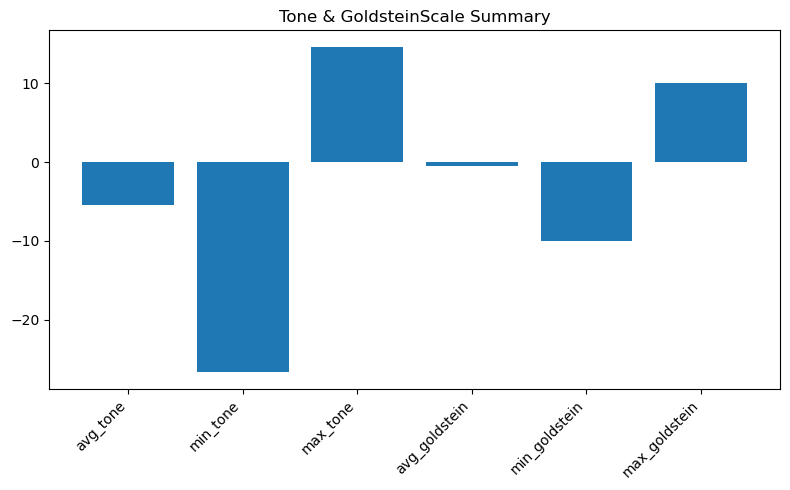

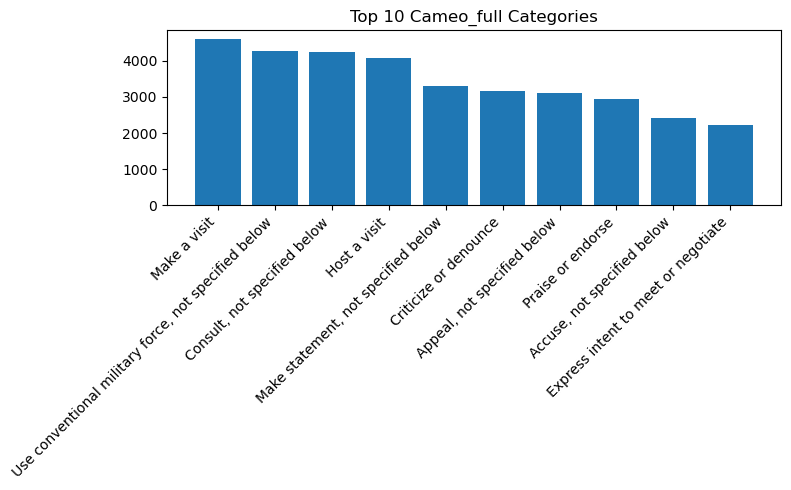

All figures shown and saved in 'figures/' directory.


In [4]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import os

# 1) Filter to 2023-10-18
df_1018 = df_final.filter(F.col("SQLDATE") == F.lit("2023-10-18"))

# 2) Create figures directory if not exists
os.makedirs('figures', exist_ok=True)

# 3) Helper function for plotting and saving
def plot_and_save(df_spark, label_cols, count_col, title, filename, label_transform=None):
    pdf = df_spark.toPandas()
    if label_transform:
        labels = label_transform(pdf)
    else:
        labels = pdf[label_cols[0]].astype(str)
    values = pdf[count_col]
    
    plt.figure(figsize=(8, 5))
    plt.bar(labels, values)
    plt.xticks(rotation=45, ha='right')
    plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.savefig(os.path.join('figures', filename))
    plt.close()

# 4) Top 10 EventBaseCodes
top_events = (
    df_1018
    .groupBy("Cameo")
    .count()
    .orderBy(F.desc("count"))
    .limit(10)
)
plot_and_save(
    top_events,
    ["Cameo"],
    "count",
    "Top 10 EventBaseCodes (2023-10-18)",
    "top_eventbasecodes.png"
)

# 5) Top 10 Actor1–Actor2 pairs
top_pairs = (
    df_1018
    .groupBy("Actor1Name", "Actor2Name")
    .count()
    .orderBy(F.desc("count"))
    .limit(10)
)
plot_and_save(
    top_pairs,
    ["Actor1Name", "Actor2Name"],
    "count",
    "Top 10 Actor1–Actor2 Pairs",
    "top_actor_pairs.png",
    label_transform=lambda pdf: pdf["Actor1Name"] + " – " + pdf["Actor2Name"]
)

# 6) Top 10 Regions/Countries
top_regions = (
    df_1018
    .groupBy("region", "ActionGeo_FullName")
    .count()
    .orderBy(F.desc("count"))
    .limit(10)
)
plot_and_save(
    top_regions,
    ["region", "ActionGeo_FullName"],
    "count",
    "Top 10 Regions / Locations",
    "top_regions.png",
    label_transform=lambda pdf: pdf["region"] + ": " + pdf["ActionGeo_FullName"]
)

# 7) Top 10 News Domains
top_domains = (
    df_1018
    .groupBy("domain_name")
    .count()
    .orderBy(F.desc("count"))
    .limit(10)
)
plot_and_save(
    top_domains,
    ["domain_name"],
    "count",
    "Top 10 News Domains",
    "top_news_domains.png"
)

# 8) Tone & GoldsteinScale summary
tone_gold = (
    df_1018
    .agg(
        F.avg("AvgTone").alias("avg_tone"),
        F.min("AvgTone").alias("min_tone"),
        F.max("AvgTone").alias("max_tone"),
        F.avg("GoldsteinScale").alias("avg_goldstein"),
        F.min("GoldsteinScale").alias("min_goldstein"),
        F.max("GoldsteinScale").alias("max_goldstein"),
    )
)
tg_pdf = tone_gold.toPandas().T.reset_index()
tg_pdf.columns = ["metric", "value"]
plt.figure(figsize=(8, 5))
plt.bar(tg_pdf["metric"], tg_pdf["value"])
plt.xticks(rotation=45, ha='right')
plt.title("Tone & GoldsteinScale Summary")
plt.tight_layout()
plt.show()
plt.savefig(os.path.join('figures', "tone_goldstein_summary.png"))
plt.close()

# 9) Top 10 Cameo_full categories
top_cameo = (
    df_1018
    .groupBy("Cameo_full")
    .count()
    .orderBy(F.desc("count"))
    .limit(10)
)
plot_and_save(
    top_cameo,
    ["Cameo_full"],
    "count",
    "Top 10 Cameo_full Categories",
    "top_cameo_full_histogram.png"
)

print("All figures shown and saved in 'figures/' directory.")


## Most frequent Actor pairs.

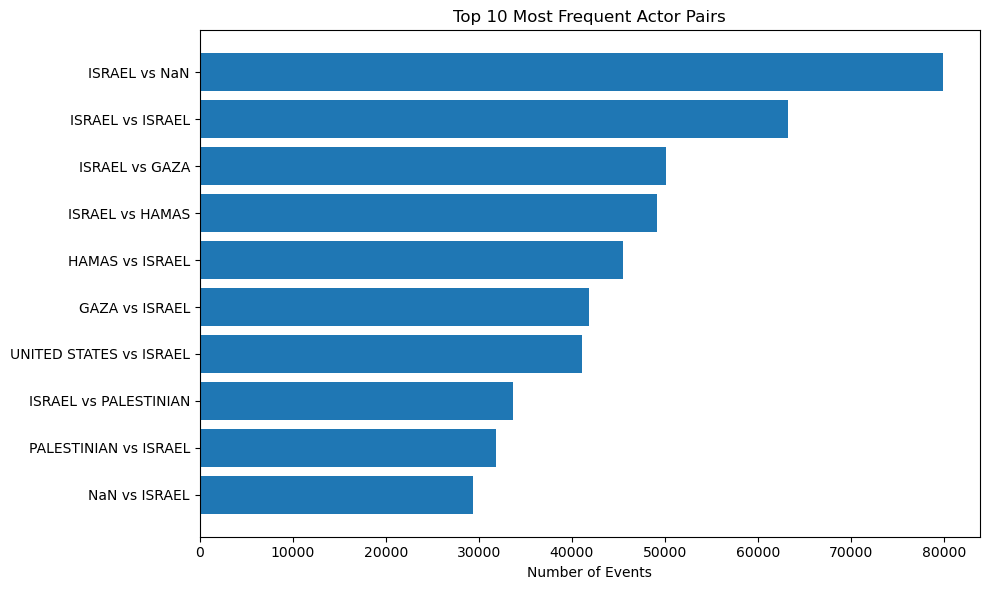

In [9]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt

# 1. Aggregate to get counts of actor pairs
actor_pairs_df = (
    df_final
    .filter(F.col("Actor1Name").isNotNull() & F.col("Actor2Name").isNotNull())
    .groupBy("Actor1Name", "Actor2Name")
    .agg(F.count("*").alias("count"))
)

# 2. Select top 10 most frequent pairs
top_pairs_df = actor_pairs_df.orderBy(F.desc("count")).limit(10)

# 3. Convert to pandas for plotting
pandas_df = top_pairs_df.toPandas()

# 4. Plot a horizontal bar chart
plt.figure(figsize=(10, 6))
plt.barh(range(len(pandas_df)), pandas_df['count'])
plt.gca().invert_yaxis()  # largest on top
labels = pandas_df['Actor1Name'] + " vs " + pandas_df['Actor2Name']
plt.yticks(range(len(pandas_df)), labels)
plt.xlabel('Number of Events')
plt.title('Top 10 Most Frequent Actor Pairs')
plt.tight_layout()
plt.show()


## The Goldstein data distribution shows that most of our data contains negative news. We can see which actors are being covered most negatively and who are being covered most positively

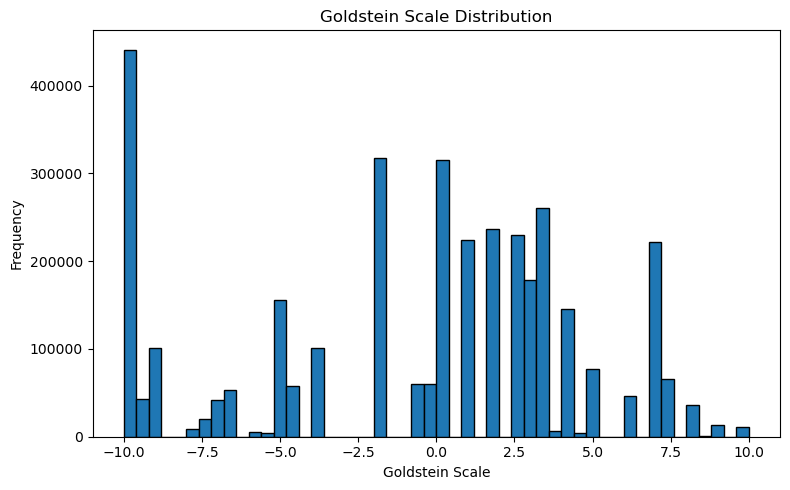

In [5]:
# 2. Distribution of Goldstein Scale
gold = df_final.select("GoldsteinScale").na.drop()
pdf2 = gold.toPandas()

plt.figure(figsize=(8, 5))
plt.hist(pdf2["GoldsteinScale"], bins=50, edgecolor="black")
plt.title("Goldstein Scale Distribution")
plt.xlabel("Goldstein Scale")
plt.ylabel("Frequency")
plt.tight_layout()

plt.show()
plt.savefig("figures/02_goldstein_distribution.png", dpi=300)
plt.close()

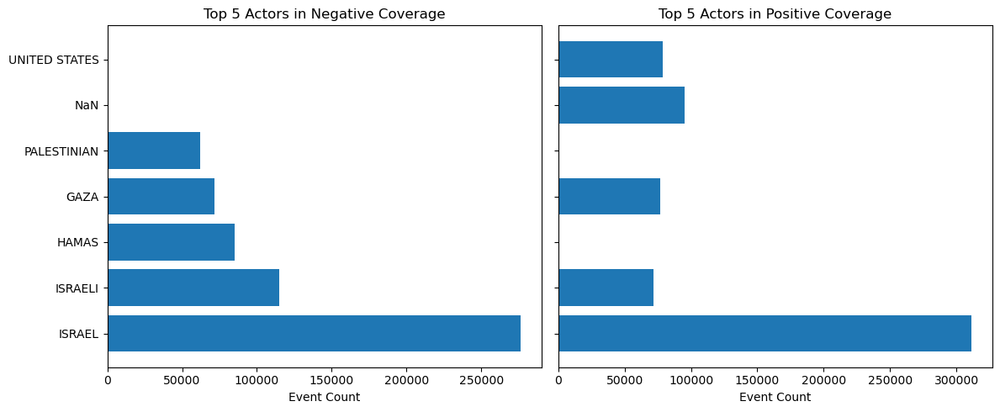

Saved combined chart to figures/top_actors_by_sentiment.png


In [6]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import os

# Make sure your df_final is loaded, and figures/ exists
os.makedirs('figures', exist_ok=True)

# 1) Top 5 actors in negative coverage (GoldsteinScale < 0)
neg_actors = (
    df_final
      .filter(F.col("GoldsteinScale") < 0)
      .groupBy("Actor1Name")
      .agg(F.count("*").alias("cnt"))
      .orderBy(F.desc("cnt"))
      .limit(5)
      .toPandas()
)

# 2) Top 5 actors in positive coverage (GoldsteinScale > 0)
pos_actors = (
    df_final
      .filter(F.col("GoldsteinScale") > 0)
      .groupBy("Actor1Name")
      .agg(F.count("*").alias("cnt"))
      .orderBy(F.desc("cnt"))
      .limit(5)
      .toPandas()
)

# 3) Plot side-by-side bar charts
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Negative actors
axes[0].barh(neg_actors["Actor1Name"], neg_actors["cnt"])
axes[0].invert_yaxis()
axes[0].set_title("Top 5 Actors in Negative Coverage")
axes[0].set_xlabel("Event Count")

# Positive actors
axes[1].barh(pos_actors["Actor1Name"], pos_actors["cnt"])
axes[1].invert_yaxis()
axes[1].set_title("Top 5 Actors in Positive Coverage")
axes[1].set_xlabel("Event Count")

plt.tight_layout()
plt.show()

# 4) Save the figure
fig.savefig("figures/top_actors_by_sentiment.png", dpi=300)
plt.close()

print("Saved combined chart to figures/top_actors_by_sentiment.png")


## From the below graph we can infer that nutral news spreads more. Media tends to cover news that are more nutral. 

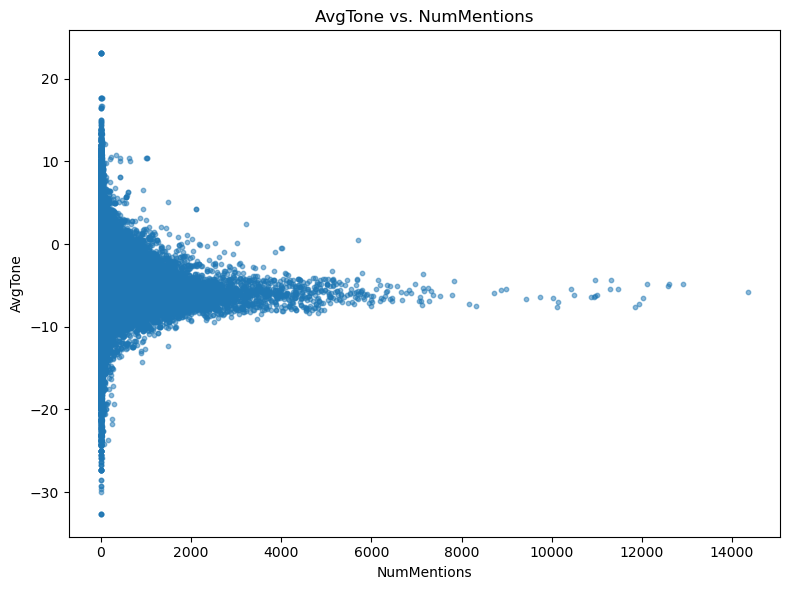

In [7]:
# 3. Event Tone vs. Mentions Scatter
scatter_df = df_final.select("AvgTone", "NumMentions").na.drop()
pdf3 = scatter_df.toPandas()

plt.figure(figsize=(8, 6))
plt.scatter(pdf3["NumMentions"], pdf3["AvgTone"], alpha=0.5, s=10)
plt.title("AvgTone vs. NumMentions")
plt.xlabel("NumMentions")
plt.ylabel("AvgTone")
plt.tight_layout()

plt.show()
plt.savefig("figures/03_tone_vs_mentions.png", dpi=300)
plt.close()

## I am trying to find top 5 state and non state actor. I found one interesting thing, Israel came up as state actor and Israeli came up as nonstate actor. This might come from Israeli settler, whio appear in news frequently because of their violent attack on Palestinians villagers.

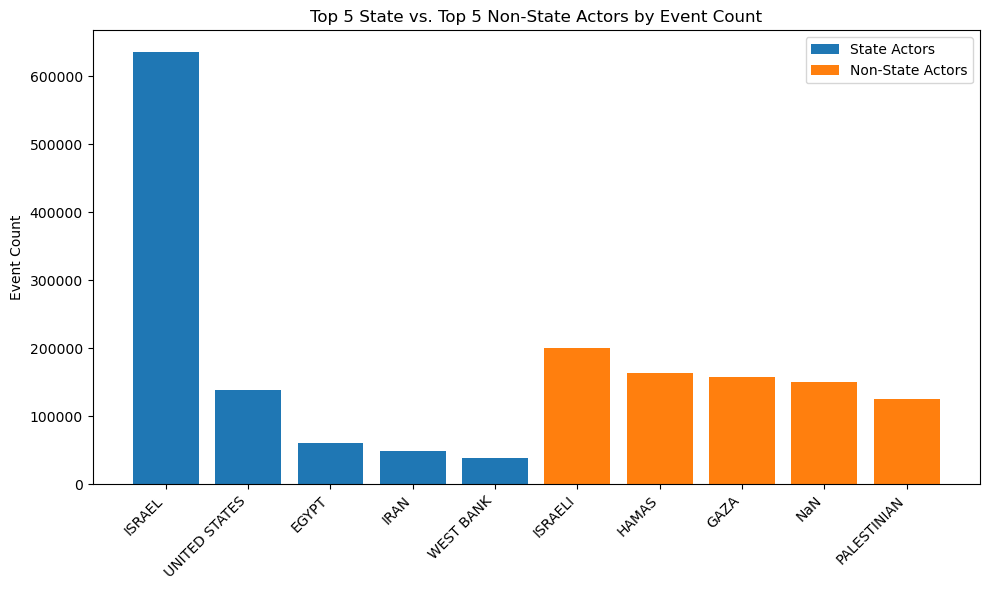

In [8]:
import os
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, desc, upper
import matplotlib.pyplot as plt
from matplotlib.patches import Patch



# 1) Read the lookup CSV and extract distinct country names
lookup_df = (
    spark
      .read
      .option("header", True)
      .csv("combined_domain_lookup_table.csv")
      .select(upper(col("country_name")).alias("country_name"))
      .distinct()
)
state_actors = [row.country_name for row in lookup_df.collect()]

# 2) Top 5 state actors by event count
state_counts = (
    df_final
      .filter(col("Actor1Name").isin(state_actors))
      .groupBy("Actor1Name")
      .count()
      .orderBy(desc("count"))
      .limit(5)
)
pdf_state = state_counts.toPandas()

# 3) Top 5 non-state actors by event count
nonstate_counts = (
    df_final
      .filter(~col("Actor1Name").isin(state_actors))
      .groupBy("Actor1Name")
      .count()
      .orderBy(desc("count"))
      .limit(5)
)
pdf_nonstate = nonstate_counts.toPandas()

# 4) Plotting
os.makedirs('figures', exist_ok=True)
labels = list(pdf_state["Actor1Name"]) + list(pdf_nonstate["Actor1Name"])
counts = list(pdf_state["count"]) + list(pdf_nonstate["count"])
colors = ["#1f77b4"] * len(pdf_state) + ["#ff7f0e"] * len(pdf_nonstate)

plt.figure(figsize=(10, 6))
plt.bar(labels, counts, color=colors)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Event Count")
plt.title("Top 5 State vs. Top 5 Non-State Actors by Event Count")

legend_elements = [
    Patch(facecolor="#1f77b4", label="State Actors"),
    Patch(facecolor="#ff7f0e", label="Non-State Actors")
]
plt.legend(handles=legend_elements)
plt.tight_layout()

plt.show()
plt.savefig("figures/06_state_vs_nonstate.png", dpi=300)
plt.close()


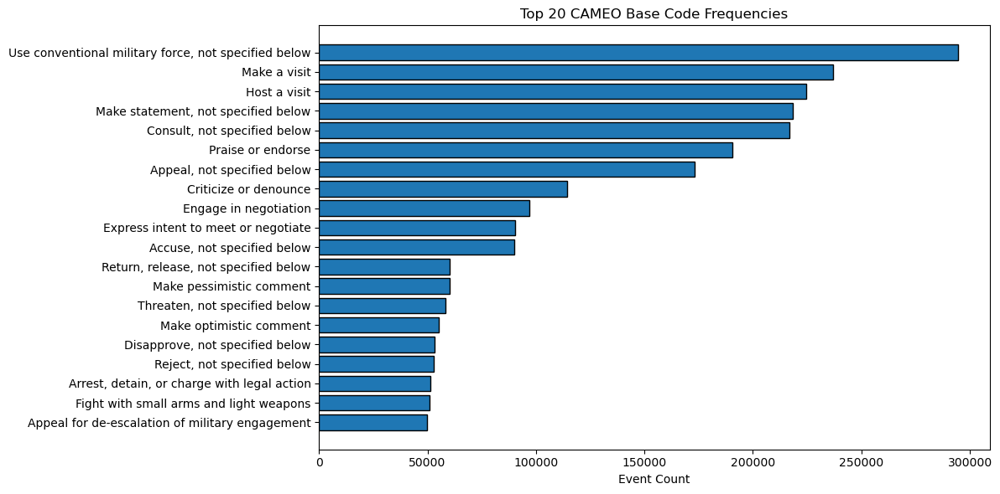

In [9]:
import os
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, desc
import matplotlib.pyplot as plt


# 1) Get top 20 base codes by event count
code_counts = (
    df_final
      .filter(col("EventBaseCode").isNotNull())
      .groupBy("EventBaseCode")
      .count()
      .orderBy(desc("count"))
      .limit(20)
)

# 2) Build a mapping of code → description
#    we take the first non-null Cameo_full we find for each code
mapping_df = (
    df_final
      .select("EventBaseCode", "Cameo_full")
      .filter(col("EventBaseCode").isNotNull() & col("Cameo_full").isNotNull())
      .dropDuplicates(["EventBaseCode"])
)

# 3) Join counts with descriptions
top_codes = (
    code_counts
      .join(mapping_df, on="EventBaseCode", how="left")
      .orderBy(desc("count"))
)

# 4) Convert to pandas for plotting
pdf5 = top_codes.toPandas()

# 5) Plot
plt.figure(figsize=(12, 6))
plt.barh(
    pdf5["Cameo_full"][::-1],   # descriptions, reversed for top-down
    pdf5["count"][::-1],        # counts
    edgecolor="black"
)
plt.title("Top 20 CAMEO Base Code Frequencies")
plt.xlabel("Event Count")
plt.tight_layout()

plt.show()
plt.savefig("figures/05_event_basecode_top20.png", dpi=300)
plt.close()


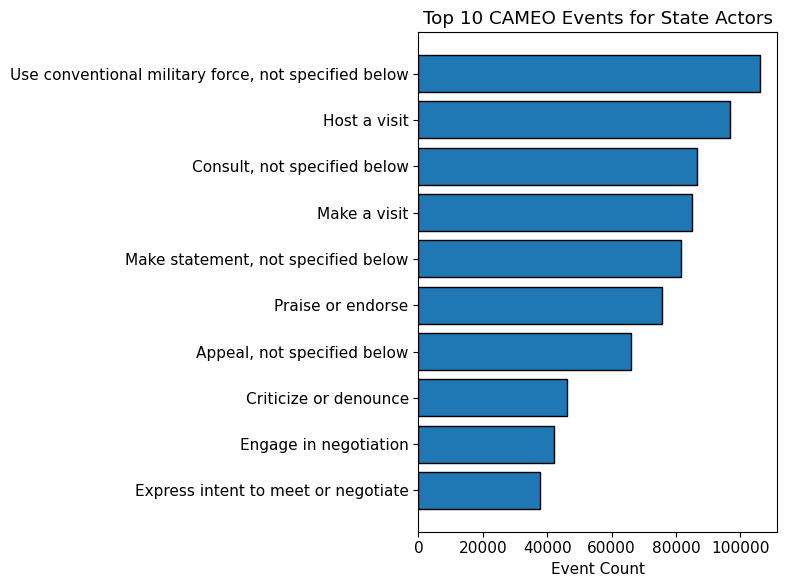

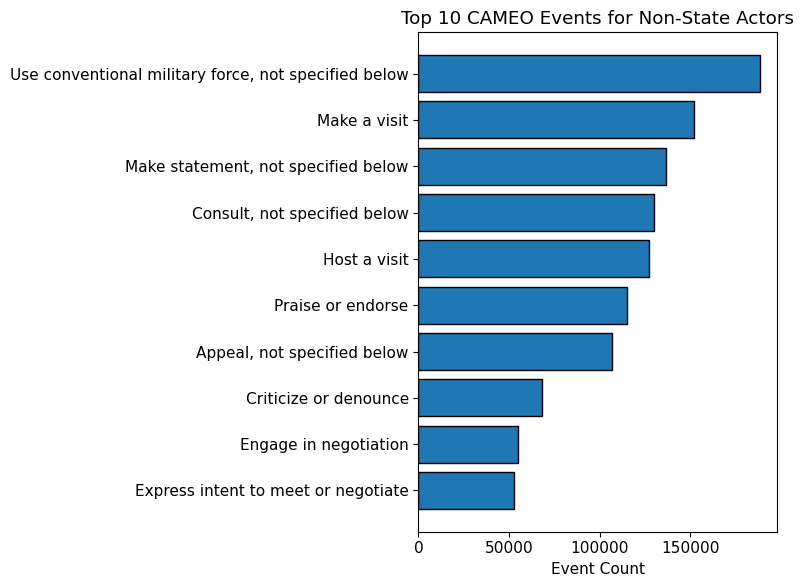

In [10]:
import os
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, when, desc
import matplotlib.pyplot as plt

lookup_df = (
    spark.read
         .option("header", True)
         .csv("combined_domain_lookup_table.csv")
         .select(col("country_name"))
         .distinct()
         .rdd.flatMap(lambda row: [row.country_name.upper()])
         .collect()
)
state_actors = lookup_df  # list of uppercase country names

# 2) Tag events
df_tagged = df_final.withColumn(
    "actor_type",
    when(col("Actor1Name").isin(state_actors), "State")
    .otherwise("Non-State")
)

# 3) For each actor_type, get top-10 Cameo_full
top_n = 10
counts = (
    df_tagged
      .filter(col("Cameo_full").isNotNull())
      .groupBy("actor_type", "Cameo_full")
      .count()
)

state_top = (
    counts.filter(col("actor_type") == "State")
          .orderBy(desc("count"))
          .limit(top_n)
          .toPandas()
)

nonstate_top = (
    counts.filter(col("actor_type") == "Non-State")
          .orderBy(desc("count"))
          .limit(top_n)
          .toPandas()
)

# 4) Ensure figures directory
os.makedirs("figures", exist_ok=True)
plt.rcParams["font.size"] = 11

# 5) Plot State
plt.figure(figsize=(8, 6))
plt.barh(state_top["Cameo_full"][::-1], state_top["count"][::-1], edgecolor="black")
plt.title("Top 10 CAMEO Events for State Actors")
plt.xlabel("Event Count")
plt.tight_layout()
plt.show()
plt.savefig("figures/07_state_cameo.png", dpi=300)
plt.close()

# 6) Plot Non-State
plt.figure(figsize=(8, 6))
plt.barh(nonstate_top["Cameo_full"][::-1], nonstate_top["count"][::-1], edgecolor="black")
plt.title("Top 10 CAMEO Events for Non-State Actors")
plt.xlabel("Event Count")
plt.tight_layout()
plt.show()
plt.savefig("figures/07_nonstate_cameo.png", dpi=300)
plt.close()


## Intermediate Level EDA

/tmp/ipykernel_71/1421772857.py:43: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


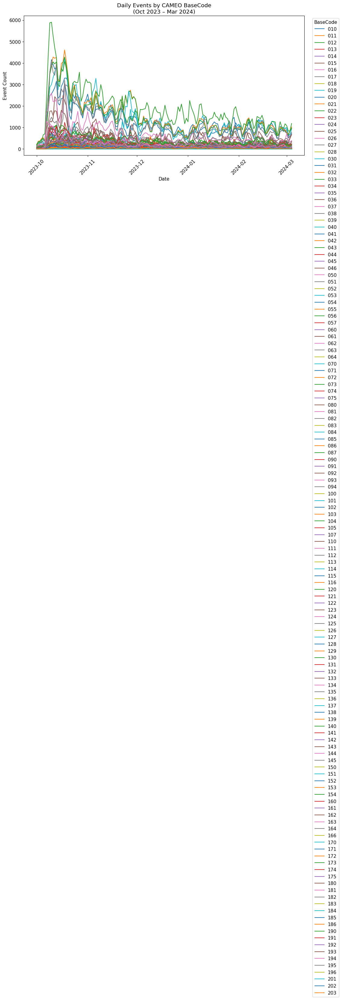

In [11]:
import os
from pyspark.sql.functions import col, count, sum as _sum
import matplotlib.pyplot as plt

# Ensure output directory
os.makedirs("figures", exist_ok=True)

# 1) Filter to Oct 2023 – Mar 2024
df_filtered = df_final.filter(
    (col("SQLDATE") >= "2023-10-01") &
    (col("SQLDATE") <= "2024-03-31")
)

# 2) Count events per day × EventBaseCode
ts_spark = (
    df_filtered
      .groupBy("SQLDATE", "EventBaseCode")
      .agg(count("*").alias("cnt"))
)

# 3) Pivot to wide format, fill missing with zero, order by date
ts_wide = (
    ts_spark
      .groupBy("SQLDATE")
      .pivot("EventBaseCode")
      .agg(_sum("cnt"))
      .na.fill(0)
      .orderBy("SQLDATE")
)

# 4) Collect to Pandas and set index
ts_pd = ts_wide.toPandas().set_index("SQLDATE")

# 5) Plot all series
plt.figure(figsize=(12, 6))
for code in ts_pd.columns:
    plt.plot(ts_pd.index, ts_pd[code], label=code)
plt.legend(title="BaseCode", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.title("Daily Events by CAMEO BaseCode\n(Oct 2023 – Mar 2024)")
plt.xlabel("Date")
plt.ylabel("Event Count")
plt.xticks(rotation=45)
plt.tight_layout()

# 6) Show and save
plt.show()
plt.savefig("figures/daily_events_oct2023_mar2024.png", dpi=300)
plt.close()



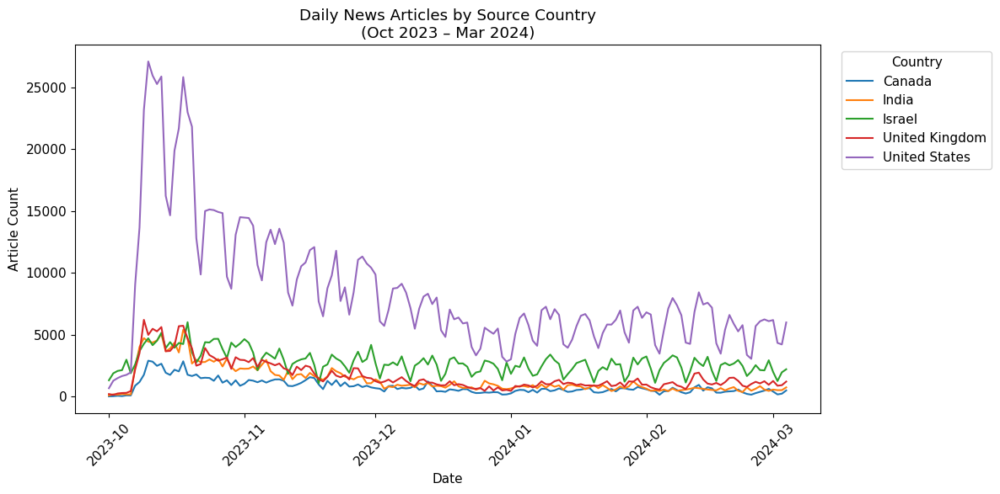

In [12]:
import os
from pyspark.sql.functions import col, count, desc, sum as _sum
import matplotlib.pyplot as plt

# 0) Spark session & df_final already initialized
# spark = SparkSession.builder.getOrCreate()
# df_final = spark.table("df_final")

# 1) Filter to Oct 2023 – Mar 2024
df_filtered = df_final.filter(
    (col("SQLDATE") >= "2023-10-01") &
    (col("SQLDATE") <= "2024-03-31")
)



# 3) Top 5 source countries by total article count (within date window)
country_counts = (
    df_filtered
      .filter(col("news_source_country").isNotNull())
      .groupBy("news_source_country")
      .count()
)
top5 = [row.news_source_country 
        for row in country_counts
                 .orderBy(desc("count"))
                 .limit(5)
                 .collect()]

# 4) Daily counts for those countries
ts = (
    df_filtered
      .filter(col("news_source_country").isin(top5))
      .groupBy("SQLDATE", "news_source_country")
      .agg(count("*").alias("cnt"))
)

# 5) Pivot to wide form
ts_wide = (
    ts
      .groupBy("SQLDATE")
      .pivot("news_source_country")
      .agg(_sum("cnt"))
      .na.fill(0)
      .orderBy("SQLDATE")
)

# 6) Convert to Pandas & set index
ts_pd = ts_wide.toPandas().set_index("SQLDATE")

# 7) Plot
plt.figure(figsize=(12, 6))
for country in ts_pd.columns:
    plt.plot(ts_pd.index, ts_pd[country], label=country)
plt.legend(title="Country", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.title("Daily News Articles by Source Country\n(Oct 2023 – Mar 2024)")
plt.xlabel("Date")
plt.ylabel("Article Count")
plt.xticks(rotation=45)
plt.tight_layout()

# 8) Show and save
plt.show()
plt.savefig("figures/daily_news_by_country_oct2023_mar2024.png", dpi=300)
plt.close()


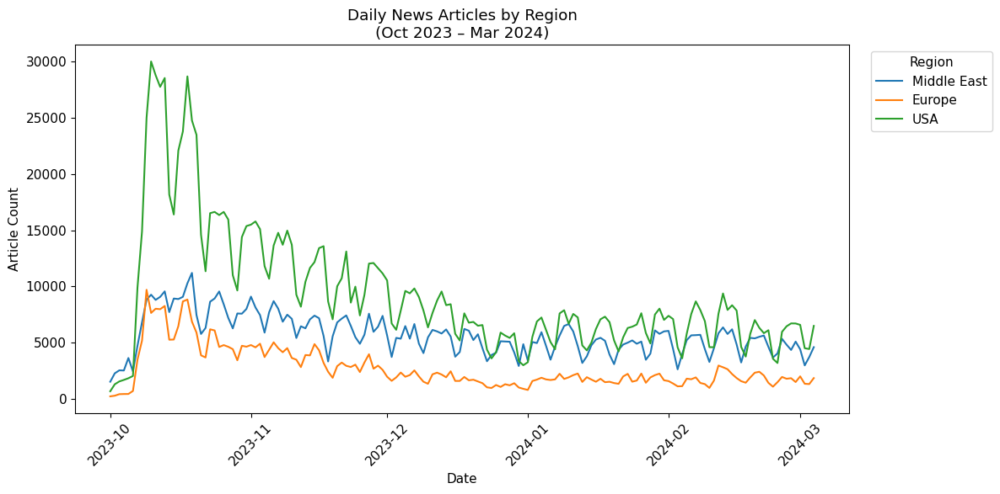

In [13]:
import os
from pyspark.sql.functions import col, count, sum as _sum
import matplotlib.pyplot as plt

# 0) Assume spark session & df_final already initialized
# spark = SparkSession.builder.getOrCreate()
# df_final = spark.table("df_final")

# 1) Filter to Oct 2023 – Mar 2024
df_filtered = df_final.filter(
    (col("SQLDATE") >= "2023-10-01") &
    (col("SQLDATE") <= "2024-03-31")
)

# 2) Define the regions of interest
regions = ["Middle East", "Europe", "USA"]  # adjust case to match your data

# 3) Compute daily counts for those regions
ts = (
    df_filtered
      .filter(col("region").isin(regions))
      .groupBy("SQLDATE", "region")
      .agg(count("*").alias("cnt"))
)

# 4) Pivot to wide form
ts_wide = (
    ts
      .groupBy("SQLDATE")
      .pivot("region", regions)
      .agg(_sum("cnt"))
      .na.fill(0)
      .orderBy("SQLDATE")
)

# 5) Convert to Pandas & set index
ts_pd = ts_wide.toPandas().set_index("SQLDATE")

# 6) Ensure output directory
os.makedirs("figures", exist_ok=True)

# 7) Plot
plt.figure(figsize=(12, 6))
for region in regions:
    plt.plot(ts_pd.index, ts_pd[region], label=region)
plt.legend(title="Region", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.title("Daily News Articles by Region\n(Oct 2023 – Mar 2024)")
plt.xlabel("Date")
plt.ylabel("Article Count")
plt.xticks(rotation=45)
plt.tight_layout()

# 8) Show and save
plt.show()
plt.savefig("figures/daily_news_by_region_oct2023_mar2024.png", dpi=300)
plt.close()


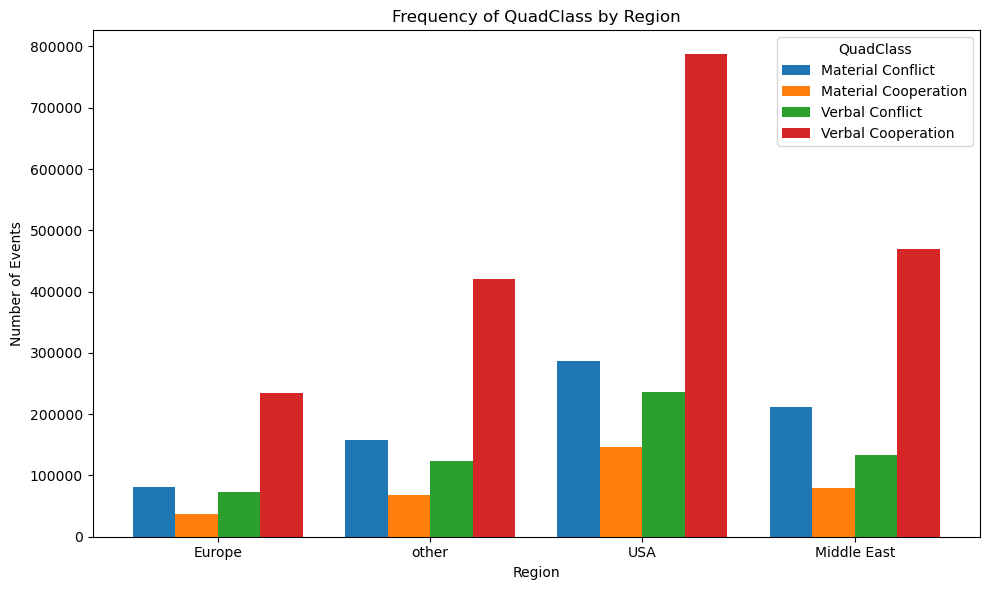

In [11]:
from pyspark.sql import functions as F

# 1. Map QuadClass → human-readable label
df_labeled = df_final.withColumn(
    "QuadClassLabel",
    F.when(F.col("QuadClass") == "1", "Verbal Cooperation")
     .when(F.col("QuadClass") == "2", "Material Cooperation")
     .when(F.col("QuadClass") == "3", "Verbal Conflict")
     .when(F.col("QuadClass") == "4", "Material Conflict")
     .otherwise("Unknown")
)

# 2. Filter out any nulls
df_qc = df_labeled.filter(
    F.col("region").isNotNull() &
    F.col("QuadClassLabel").isNotNull()
)

# 3. Count by (region, QuadClassLabel)
counts = (
    df_qc
    .groupBy("region", "QuadClassLabel")
    .agg(F.count("*").alias("count"))
)

# 4. Pivot so each label is its own column
pivoted = (
    counts
    .groupBy("region")
    .pivot("QuadClassLabel")
    .sum("count")
    .na.fill(0)
)

# 5. Bring into Pandas for plotting
pdf = pivoted.toPandas()

import matplotlib.pyplot as plt
import numpy as np

regions = pdf["region"].tolist()
labels = [c for c in pdf.columns if c != "region"]
x = np.arange(len(regions))
width = 0.2

plt.figure(figsize=(10, 6))

for i, label in enumerate(labels):
    plt.bar(x + i*width, pdf[label], width, label=label)

plt.xticks(x + width*(len(labels)-1)/2, regions)
plt.xlabel("Region")
plt.ylabel("Number of Events")
plt.title("Frequency of QuadClass by Region")
plt.legend(title="QuadClass")
plt.tight_layout()
plt.show()


+------+----------+-------------------+
|region|   SQLDATE|           avg_tone|
+------+----------+-------------------+
|Europe|2023-10-01| -3.546782755296827|
|Europe|2023-10-02|-3.2603079192254736|
|Europe|2023-10-03|-2.7455059025046014|
|Europe|2023-10-04|-3.4272011412870005|
|Europe|2023-10-05| -4.092556390855416|
|Europe|2023-10-06|-4.8374734209169095|
|Europe|2023-10-07| -5.845223476716175|
|Europe|2023-10-08| -5.321570234806478|
|Europe|2023-10-09|  -4.98403410013147|
|Europe|2023-10-10| -4.885200663750312|
|Europe|2023-10-11| -4.466364086268892|
|Europe|2023-10-12| -4.701194372483333|
|Europe|2023-10-13| -4.601766032811893|
|Europe|2023-10-14| -4.741981450507484|
|Europe|2023-10-15| -4.789867533073337|
|Europe|2023-10-16|  -4.72828953563086|
|Europe|2023-10-17| -4.725778180739534|
|Europe|2023-10-18|-5.5663320138796415|
|Europe|2023-10-19| -4.513269033849882|
|Europe|2023-10-20| -4.054113526149443|
+------+----------+-------------------+
only showing top 20 rows



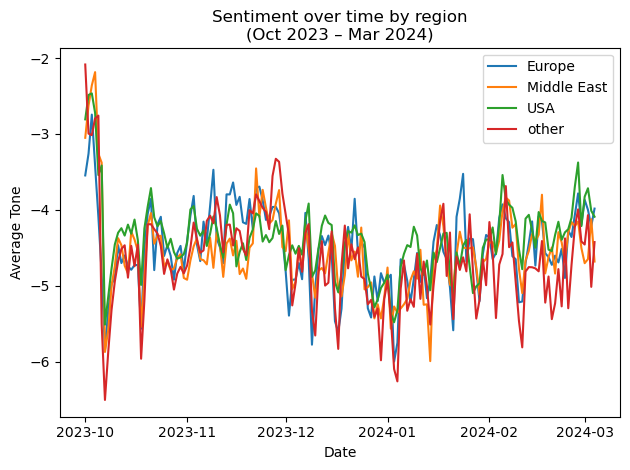

In [16]:
from pyspark.sql.functions import col, avg

# Define your date bounds
start = "2023-10-01"
end   = "2024-03-31"

sentiment_ts = (
    df_final
      # 1) keep only rows in the Oct 2023–Mar 2024 window
      .filter(col("SQLDATE").between(start, end))
      # 2) then group and avg as before
      .groupBy("region", "SQLDATE")
      .agg(avg(col("AvgTone")).alias("avg_tone"))
      .orderBy("region", "SQLDATE")
)

sentiment_ts.show()

# Collect to Pandas and plot
pdf = sentiment_ts.toPandas()

import matplotlib.pyplot as plt

for region in pdf.region.unique():
    sub = pdf[pdf.region == region]
    plt.plot(sub.SQLDATE, sub.avg_tone, label=region)

plt.legend()
plt.xlabel("Date")
plt.ylabel("Average Tone")
plt.title("Sentiment over time by region\n(Oct 2023 – Mar 2024)")
plt.tight_layout()
plt.show()


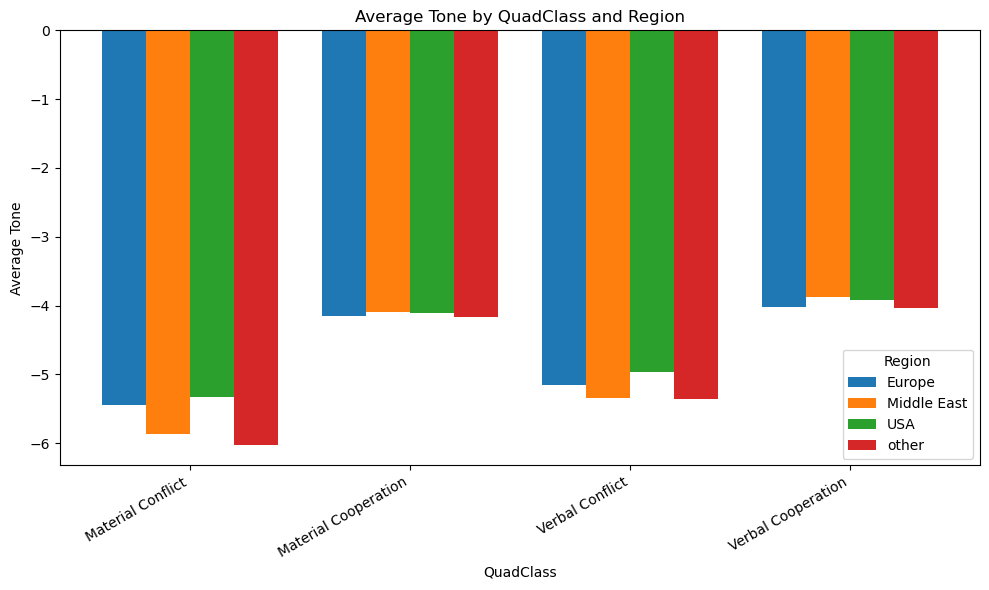

In [18]:
from pyspark.sql.functions import when, col, avg

# 1. Map numeric QuadClass → text label
df_labeled = df_final.withColumn(
    "QCLabel",
    when(col("QuadClass") == "1", "Verbal Cooperation")
   .when(col("QuadClass") == "2", "Material Cooperation")
   .when(col("QuadClass") == "3", "Verbal Conflict")
   .when(col("QuadClass") == "4", "Material Conflict")
   .otherwise("Unknown")
)

# 2. Compute average AvgTone by (QCLabel, region)
avg_tone_df = (
    df_labeled
      .filter(col("QCLabel") != "Unknown")
      .groupBy("QCLabel", "region")
      .agg(avg("AvgTone").alias("avg_tone"))
)

# 3. Bring into Pandas and pivot so regions become columns
pdf = avg_tone_df.toPandas()
pdf_pivot = (
    pdf
    .pivot(index="QCLabel", columns="region", values="avg_tone")
    .fillna(0)  # if some combos are missing
)
import matplotlib.pyplot as plt
import numpy as np

# Setup
labels = pdf_pivot.index.tolist()
regions = pdf_pivot.columns.tolist()
x = np.arange(len(labels))
width = 0.2

fig, ax = plt.subplots(figsize=(10, 6))

# One bar-series per region
for i, region in enumerate(regions):
    ax.bar(x + i*width,
           pdf_pivot[region].values,
           width,
           label=region)

# Cosmetics
ax.set_xticks(x + width*(len(regions)-1)/2)
ax.set_xticklabels(labels, rotation=30, ha="right")
ax.set_xlabel("QuadClass")
ax.set_ylabel("Average Tone")
ax.set_title("Average Tone by QuadClass and Region")
ax.legend(title="Region")
plt.tight_layout()
plt.show()


   region     SQLDATE  avg_tone
0  Europe  2023-10-01 -4.880471
1  Europe  2023-10-02 -4.346073
2  Europe  2023-10-03 -4.385421
3  Europe  2023-10-04 -4.486164
4  Europe  2023-10-05 -6.916425


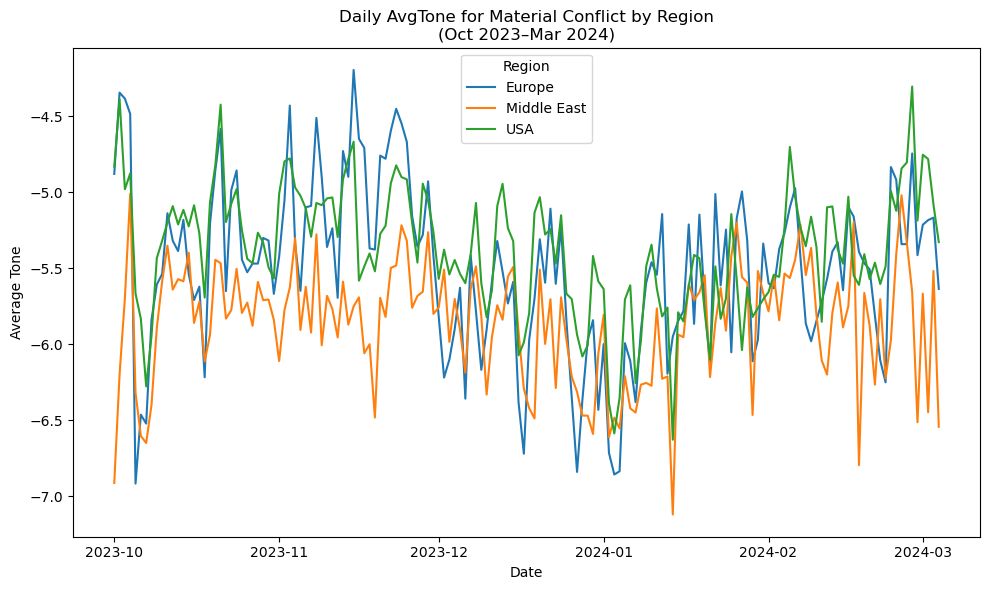

In [24]:
from pyspark.sql.functions import when, col, avg

# 1. Label & filter to Material Conflict
df_mc = (
    df_final
      .withColumn(
        "QCLabel",
        when(col("QuadClass") == "1", "Verbal Cooperation")
       .when(col("QuadClass") == "2", "Material Cooperation")
       .when(col("QuadClass") == "3", "Verbal Conflict")
       .when(col("QuadClass") == "4", "Material Conflict")
       .otherwise(None)
      )
      .filter(col("QCLabel") == "Material Conflict")
      # 2. Filter the date window Oct 2023 – Mar 2024
      .filter(col("SQLDATE").between("2023-10-01", "2024-03-31"))
      .filter(col("region") != "other") 
)

# 3. Compute daily mean tone by region
sentiment_ts = (
    df_mc
      .groupBy("region", "SQLDATE")
      .agg(avg("AvgTone").alias("avg_tone"))
      .orderBy("region", "SQLDATE")
)

# 4. Collect to Pandas for plotting
pdf = sentiment_ts.toPandas()
print(pdf.head(5))

import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
for region in pdf.region.unique():
    sub = pdf[pdf.region == region]
    plt.plot(sub.SQLDATE, sub.avg_tone, label=region)

plt.legend(title="Region")
plt.xlabel("Date")
plt.ylabel("Average Tone")
plt.title("Daily AvgTone for Material Conflict by Region\n(Oct 2023–Mar 2024)")
plt.tight_layout()
plt.show()


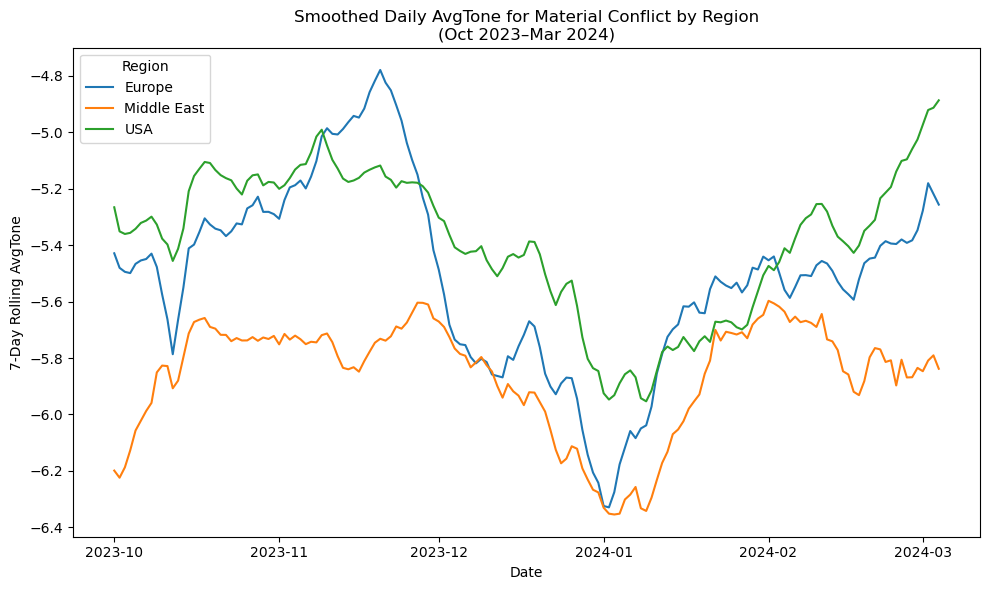

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Sort and compute a 7-day centered rolling mean per region
pdf = pdf.sort_values(["region","SQLDATE"])
pdf["avg_tone_smoothed"] = (
    pdf
    .groupby("region")["avg_tone"]
    .transform(lambda s: s.rolling(window=14, center=True, min_periods=1).mean())
)

# 2. Plot the smoothed series
plt.figure(figsize=(10,6))
for region in pdf.region.unique():
    sub = pdf[pdf.region == region]
    plt.plot(sub.SQLDATE, sub.avg_tone_smoothed, label=region)

plt.legend(title="Region")
plt.xlabel("Date")
plt.ylabel("7-Day Rolling AvgTone")
plt.title("Smoothed Daily AvgTone for Material Conflict by Region\n(Oct 2023–Mar 2024)")
plt.tight_layout()
plt.show()


In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

# --- assume `pdf` is your pandas DataFrame with
#     columns SQLDATE (datetime64), region, avg_tone_smoothed

# 1) Ensure SQLDATE is a pandas datetime
pdf["SQLDATE"] = pd.to_datetime(pdf["SQLDATE"])

# 2) Build a list of unique pandas.Timestamp frames
dates = pdf["SQLDATE"].drop_duplicates().sort_values().tolist()  # list of pd.Timestamp
regions = pdf["region"].unique().tolist()

# 3) Prepare the figure & line objects
fig, ax = plt.subplots(figsize=(10, 6))
lines = {reg: ax.plot([], [], label=reg)[0] for reg in regions}

ax.set_xlim(dates[0], dates[-1])
ymin, ymax = pdf["avg_tone_smoothed"].min(), pdf["avg_tone_smoothed"].max()
ax.set_ylim(ymin - 0.5, ymax + 0.5)
ax.set_xlabel("Date")
ax.set_ylabel("7-Day Rolling AvgTone")
ax.legend(loc="upper left")

def init():
    for line in lines.values():
        line.set_data([], [])
    return lines.values()

def update(frame_date: pd.Timestamp):
    # frame_date is now a pd.Timestamp, so .date() works
    for reg in regions:
        sub = pdf[(pdf["region"] == reg) & (pdf["SQLDATE"] <= frame_date)]
        lines[reg].set_data(sub["SQLDATE"], sub["avg_tone_smoothed"])
    # Use strftime to format nicely
    ax.set_title(
        "Material Conflict Sentiment by Region\nUp to " 
        + frame_date.strftime("%Y-%m-%d")
    )
    return lines.values()

ani = FuncAnimation(
    fig, update,
    frames=dates,
    init_func=init,
    blit=True,
    interval=100
)

# 4) Save the GIF
writer = PillowWriter(fps=10)
ani.save("material_conflict_sentiment.gif", writer=writer)

plt.close(fig)
print("Saved animation to material_conflict_sentiment.gif")


Saved animation to material_conflict_sentiment.gif


## Also, we need to have graph that shows how the tone changes depending on who is talked about, and if there is a difference on that in different areas or countries. I think this is the most central question we were supposed to have in this research: is there a difference on how media in different places reports on actions by Israel to how they report on actions by Palestine.

+-----------+------+
|     region| count|
+-----------+------+
|     Europe| 42913|
|        USA|150321|
|Middle East|119640|
+-----------+------+



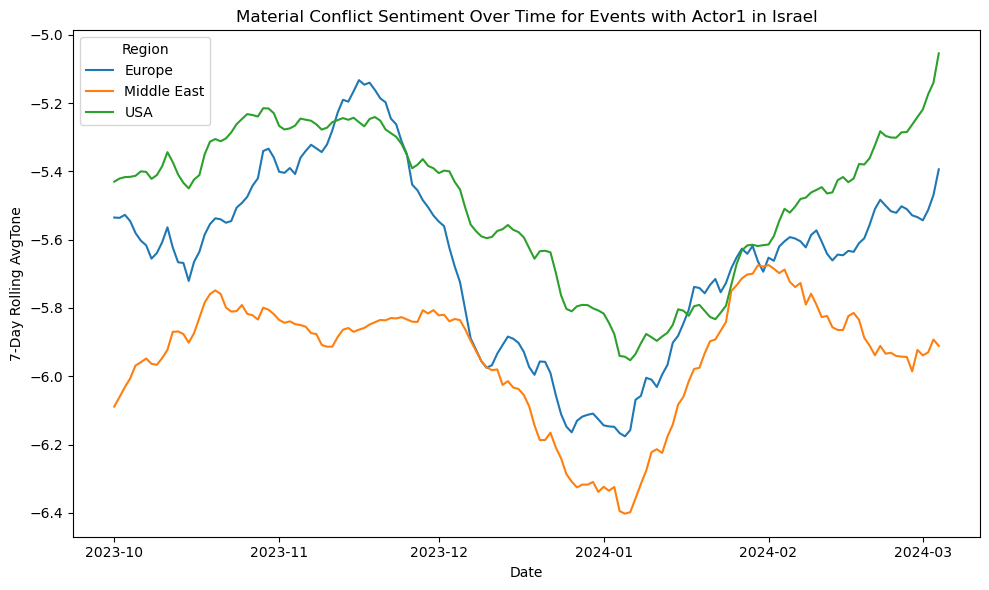

In [6]:
# from pyspark.sql.functions import col, avg
import pandas as pd
import matplotlib.pyplot as plt

# 1. Filter to Actor1 located in “Israel” & Material Conflict (QuadClass = "4"), drop “Other”, and restrict dates
df_sel = (
    df_final
      .filter(col("Actor1Geo_FullName").contains("Israel"))      # actor1 in Israel
      .filter(col("QuadClass") == "4")                           # Material Conflict
      .filter(col("region") != "other")                         # exclude “Other”
      .filter(col("SQLDATE").between("2023-10-01", "2024-03-31"))
)

# 2. Sanity check: how many events per region?
df_sel.groupBy("region").count().show()

# 3. Compute daily avg tone by region
sentiment_ts = (
    df_sel
      .groupBy("region", "SQLDATE")
      .agg(avg("AvgTone").alias("avg_tone"))
      .orderBy("region", "SQLDATE")
)

# 4. To Pandas & smooth with a 7-day rolling window
pdf = sentiment_ts.toPandas()
pdf["SQLDATE"] = pd.to_datetime(pdf["SQLDATE"])
pdf = pdf.sort_values(["region","SQLDATE"])
pdf["smoothed"] = (
    pdf
    .groupby("region")["avg_tone"]
    .transform(lambda s: s.rolling(21, center=True, min_periods=1).mean())
)

# 5. Plot
plt.figure(figsize=(10,6))
for region in pdf.region.unique():
    sub = pdf[pdf.region == region]
    plt.plot(sub.SQLDATE, sub.smoothed, label=region)

plt.legend(title="Region")
plt.xlabel("Date")
plt.ylabel("7-Day Rolling AvgTone")
plt.title("Material Conflict Sentiment Over Time for Events with Actor1 in Israel")
plt.tight_layout()
plt.show()


Event counts by region:
+-----------+-----+
|region     |count|
+-----------+-----+
|Europe     |14122|
|USA        |48384|
|Middle East|33128|
+-----------+-----+



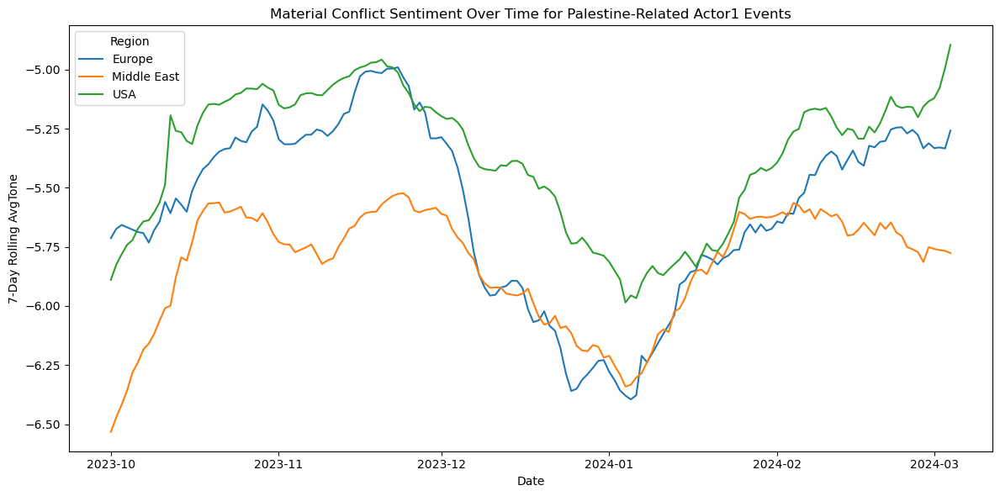

In [5]:
from pyspark.sql.functions import col, avg, lower
import pandas as pd
import matplotlib.pyplot as plt

# 1. Define your keywords and build a single case-insensitive regex
keywords = ['Palestine', 'Palestinians', 'Hamas', 'Gaza', 'West Bank', 'West bank']
pattern = "(?i)" + "|".join(kw.replace(" ", r"\s+") for kw in keywords)

# 2. Filter the Spark DataFrame
df_sel = (
    df_final
      # Actor1Name matches any of the Palestine-related terms
      .filter(col("Actor1Name").rlike(pattern))
      # Material Conflict (QuadClass = 4)
      .filter(col("QuadClass") == "4")
      # Exclude the “other” region bucket
      .filter(col("region") != "other")
      # Limit to events between 2023-10-01 and 2024-03-31
      .filter(col("SQLDATE").between("2023-10-01", "2024-03-31"))
      .cache()  # cache since we’ll use it twice
)

# 3. Sanity check: see counts by region
print("Event counts by region:")
df_sel.groupBy("region").count().show(truncate=False)

# 4. Compute daily average tone by region
sentiment_ts = (
    df_sel
      .groupBy("region", "SQLDATE")
      .agg(avg("AvgTone").alias("avg_tone"))
      .orderBy("region", "SQLDATE")
)

# 5. Convert to Pandas for smoothing & plotting
pdf = sentiment_ts.toPandas()
pdf["SQLDATE"] = pd.to_datetime(pdf["SQLDATE"])
pdf = pdf.sort_values(["region", "SQLDATE"])

# 6. Apply a 7-day centered rolling mean per region
pdf["smoothed"] = (
    pdf
    .groupby("region")["avg_tone"]
    .transform(lambda s: s.rolling(window=21, center=True, min_periods=1).mean())
)

# 7. Plot
plt.figure(figsize=(12, 6))
for region in pdf["region"].unique():
    sub = pdf[pdf["region"] == region]
    plt.plot(sub["SQLDATE"], sub["smoothed"], label=region)

plt.legend(title="Region")
plt.xlabel("Date")
plt.ylabel("7-Day Rolling AvgTone")
plt.title("Material Conflict Sentiment Over Time for Palestine-Related Actor1 Events")
plt.tight_layout()
plt.show()


+-----------+-----------------+-----------+----+
|region     |domain_name      |event_count|rank|
+-----------+-----------------+-----------+----+
|Europe     |dailymail.co.uk  |1907       |1   |
|Europe     |theguardian.com  |852        |2   |
|Europe     |independent.co.uk|647        |3   |
|Europe     |dw.com           |414        |4   |
|Europe     |telegraph.co.uk  |389        |5   |
|Middle East|timesofisrael.com|1998       |1   |
|Middle East|jpost.com        |1680       |2   |
|Middle East|al-monitor.com   |1293       |3   |
|Middle East|aljazeera.com    |1135       |4   |
|Middle East|presstv.ir       |1121       |5   |
|USA        |news.yahoo.com   |3315       |1   |
|USA        |nypost.com       |819        |2   |
|USA        |breitbart.com:443|815        |3   |
|USA        |foxnews.com      |772        |4   |
|USA        |cnn.com          |703        |5   |
+-----------+-----------------+-----------+----+



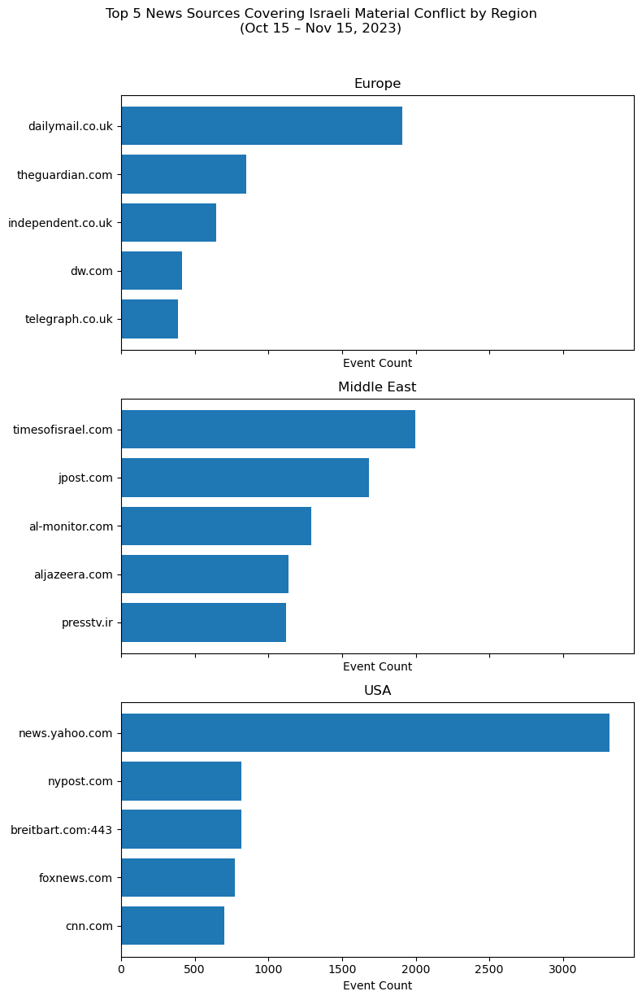

In [45]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# 1) Filter to Israel-initiated Material Conflict in your window
df_sel = (
    df_final
      .filter(F.col("Actor1Geo_FullName").contains("Israel"))
      .filter(F.col("QuadClass") == "4")
      .filter(F.col("region") != "other")
      .filter(F.col("SQLDATE").between("2023-10-15", "2023-11-15"))
)

# 2) Count events per (region, domain_name)
counts = (
    df_sel
      .groupBy("region", "domain_name")
      .agg(F.count("*").alias("event_count"))
)

# 3) Define a window to rank within each region by descending count
w = Window.partitionBy("region").orderBy(F.desc("event_count"))

top_sources = (
    counts
      .withColumn("rank", F.row_number().over(w))
      .filter(F.col("rank") <= 5)               # keep top 5
      .orderBy("region", "rank")
)

top_sources.show(truncate=False)

import matplotlib.pyplot as plt

# Convert Spark DF to pandas if you haven’t already
pdf_top = top_sources.toPandas()

# Identify regions
regions = pdf_top['region'].unique()
n = len(regions)

# Create a vertical stack of horizontal‐bar subplots
fig, axes = plt.subplots(n, 1, figsize=(8, 4*n), sharex=True)

for ax, region in zip(axes, regions):
    # Sort by count descending so largest bar is at top
    sub = pdf_top[pdf_top['region'] == region].sort_values('event_count', ascending=False)
    ax.barh(sub['domain_name'], sub['event_count'])
    ax.set_title(region)
    ax.set_xlabel('Event Count')
    ax.invert_yaxis()  # so the top source appears first

# Super‐title
fig.suptitle(
    "Top 5 News Sources Covering Israeli Material Conflict by Region\n(Oct 15 – Nov 15, 2023)",
    y=1.02
)

plt.tight_layout()
plt.show()



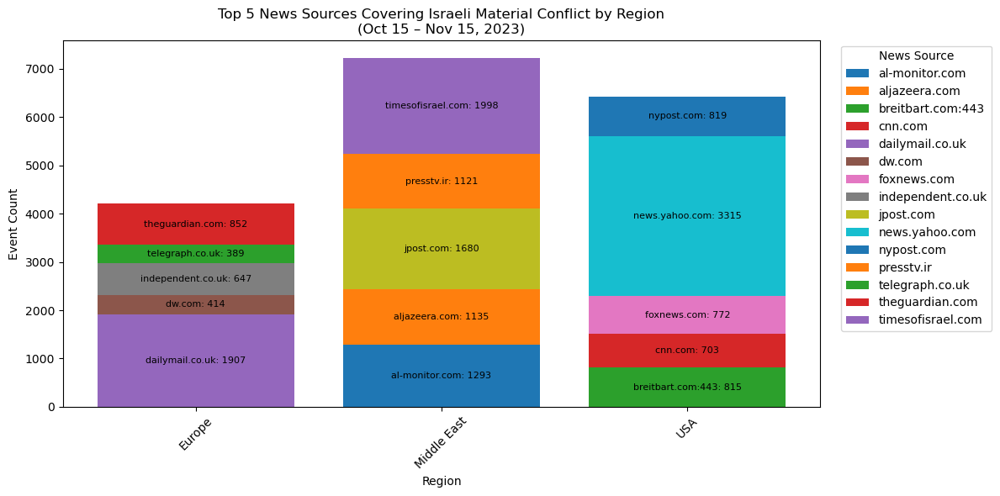

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# 1) Filter to Israel-initiated Material Conflict between Oct 15–Nov 15, 2023
df_sel = (
    df_final
      .filter(F.col("Actor1Geo_FullName").contains("Israel"))
      .filter(F.col("QuadClass") == "4")
      .filter(F.col("region") != "other")
      .filter(F.col("SQLDATE").between("2023-10-15", "2023-11-15"))
)

# 2) Count events per (region, domain_name)
counts = (
    df_sel
      .groupBy("region", "domain_name")
      .agg(F.count("*").alias("event_count"))
)

# 3) Rank within each region and keep top 5
w = Window.partitionBy("region").orderBy(F.desc("event_count"))
top_sources = (
    counts
      .withColumn("rank", F.row_number().over(w))
      .filter(F.col("rank") <= 5)
)

# 4) Pull into Pandas
pdf_top = top_sources.toPandas()

# 5) Pivot so each domain_name becomes a column
df_pivot = pdf_top.pivot(index='region', columns='domain_name', values='event_count').fillna(0)

# 6) Prepare for plotting
regions = df_pivot.index.tolist()
sources = df_pivot.columns.tolist()
x = np.arange(len(regions))
bottom = np.zeros(len(regions))

# 7) Create stacked bar chart
fig, ax = plt.subplots(figsize=(12, 6))

for source in sources:
    values = df_pivot[source].values
    bars = ax.bar(x, values, bottom=bottom, label=source)
    mid = bottom + values / 2
    for xi, yi, val in zip(x, mid, values):
        if val > 0:
            ax.text(xi, yi, f"{source}: {int(val)}", ha='center', va='center', fontsize=8)
    bottom += values

# 8) Formatting
ax.set_xticks(x)
ax.set_xticklabels(regions)
ax.set_xlabel('Region')
ax.set_ylabel('Event Count')
ax.set_title('Top 5 News Sources Covering Israeli Material Conflict by Region\n(Oct 15 – Nov 15, 2023)')
ax.xaxis.set_tick_params(rotation=45)
ax.legend(title='News Source', bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()


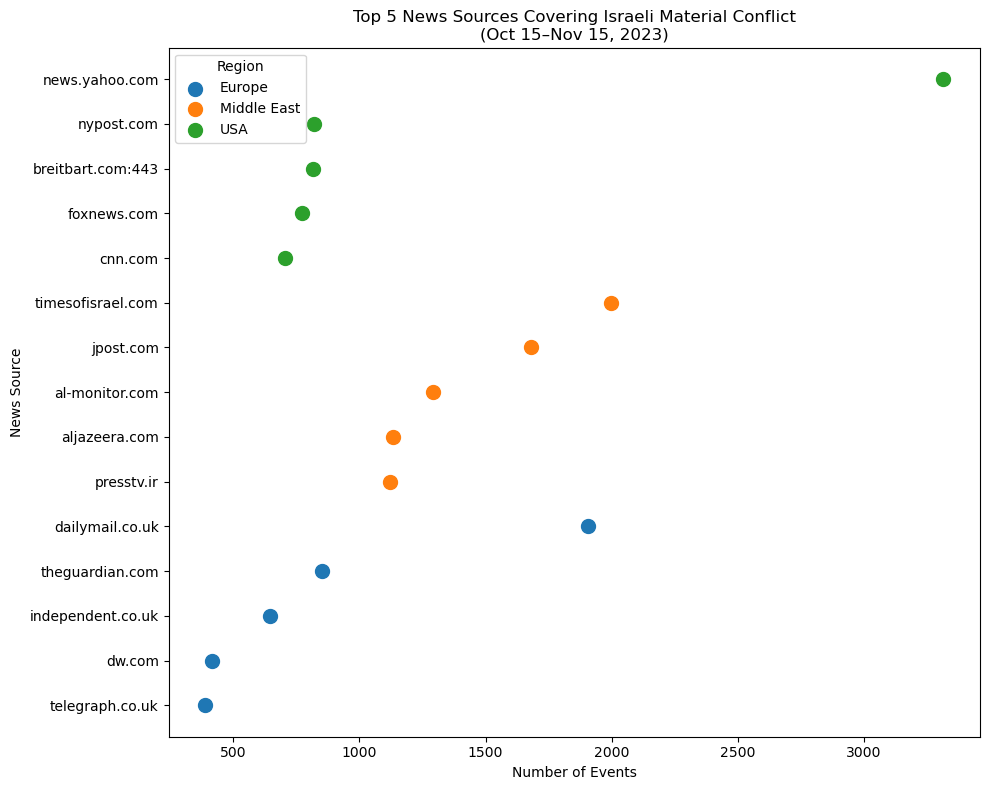

In [46]:
import matplotlib.pyplot as plt

# Rebuild your pandas table if needed
pdf_top = top_sources.toPandas()

# Sort so the smallest counts are at the bottom of the y‐axis
pdf_plot = pdf_top.sort_values('event_count', ascending=True)

plt.figure(figsize=(10, 8))

# One dot per source, colored by region
for region, grp in pdf_plot.groupby('region'):
    plt.scatter(grp['event_count'], grp['domain_name'], label=region, s=100)

plt.xlabel('Number of Events')
plt.ylabel('News Source')
plt.title('Top 5 News Sources Covering Israeli Material Conflict\n(Oct 15–Nov 15, 2023)')
plt.legend(title='Region')
plt.tight_layout()
plt.show()


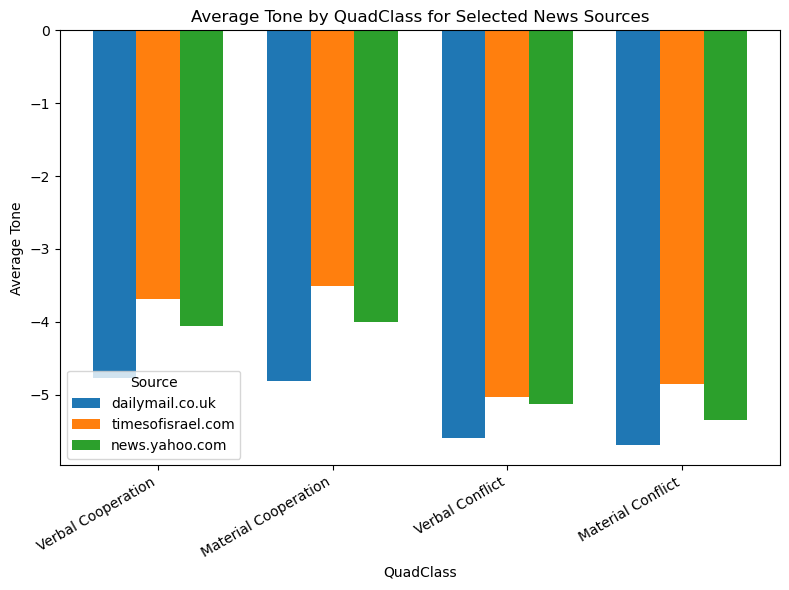

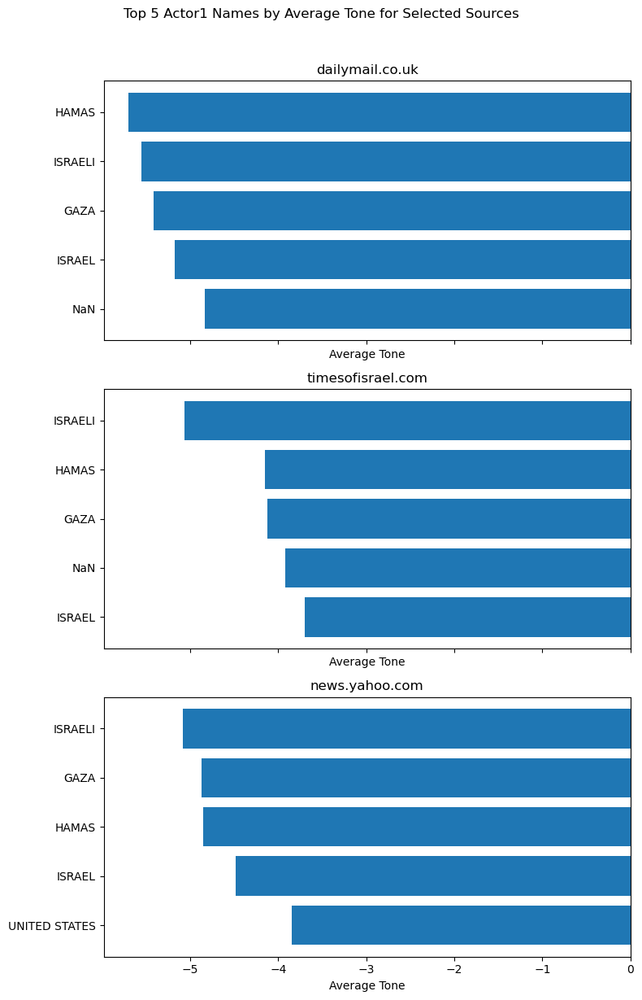

In [48]:
from pyspark.sql.functions import when, col, avg, count, row_number
from pyspark.sql.window import Window

# 1. Label QuadClass
df_labeled = df_final.withColumn(
    "QCLabel",
    when(col("QuadClass") == "1", "Verbal Cooperation")
   .when(col("QuadClass") == "2", "Material Cooperation")
   .when(col("QuadClass") == "3", "Verbal Conflict")
   .when(col("QuadClass") == "4", "Material Conflict")
   .otherwise("Unknown")
)

selected_sources = ["dailymail.co.uk", "timesofisrael.com", "news.yahoo.com"]

# 2a. Avg tone by QuadClass & source
avg_event = (
    df_labeled
      .filter(col("domain_name").isin(selected_sources))
      .filter(col("SQLDATE").between("2023-10-15", "2023-11-15"))
      .filter(col("QCLabel") != "Unknown")
      .groupBy("QCLabel", "domain_name")
      .agg(avg("AvgTone").alias("avg_tone"))
)

# 2b. Top 5 actors by count & their avg tone
actor_counts = (
    df_labeled
      .filter(col("domain_name").isin(selected_sources))
      .filter(col("SQLDATE").between("2023-10-15", "2023-11-15"))
      .groupBy("domain_name", "Actor1Name")
      .agg(count("*").alias("cnt"), avg("AvgTone").alias("avg_tone"))
)
w = Window.partitionBy("domain_name").orderBy(col("cnt").desc())
top_actors = (
    actor_counts
      .withColumn("rank", row_number().over(w))
      .filter(col("rank") <= 5)
)

# 3. Collect to Pandas
pdf_event = avg_event.toPandas()
pdf_actor = top_actors.toPandas()

import numpy as np
import matplotlib.pyplot as plt

# A) Plot average tone by QuadClass
labels = ["Verbal Cooperation", "Material Cooperation", "Verbal Conflict", "Material Conflict"]
x = np.arange(len(labels))
width = 0.25
sources = ["dailymail.co.uk", "timesofisrael.com", "news.yahoo.com"]

plt.figure(figsize=(8, 6))
for i, src in enumerate(sources):
    vals = pdf_event[pdf_event["domain_name"] == src].set_index("QCLabel").reindex(labels)["avg_tone"]
    plt.bar(x + i*width, vals, width, label=src)

plt.xticks(x + width*(len(sources)-1)/2, labels, rotation=30, ha="right")
plt.xlabel("QuadClass")
plt.ylabel("Average Tone")
plt.title("Average Tone by QuadClass for Selected News Sources")
plt.legend(title="Source")
plt.tight_layout()
plt.show()

# B) Plot top Actor1 average tone per source
fig, axes = plt.subplots(len(sources), 1, figsize=(8, 4*len(sources)), sharex=True)
for ax, src in zip(axes, sources):
    sub = pdf_actor[pdf_actor["domain_name"] == src].sort_values("avg_tone")
    ax.barh(sub["Actor1Name"], sub["avg_tone"])
    ax.set_title(src)
    ax.set_xlabel("Average Tone")
    ax.invert_yaxis()

fig.suptitle("Top 5 Actor1 Names by Average Tone for Selected Sources", y=1.02)
plt.tight_layout()
plt.show()


In [15]:

!pip install pycountry
!pip install plotly
!pip install -U kaleido

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 29.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 31.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 332.4/332.4 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 18.1 MB/s eta 0:00:00:00:0100:01


In [16]:

# 1) Spark aggregation
country_counts = (
    df_final
      .groupBy("news_source_country")
      .count()
      .filter(col("news_source_country").isNotNull())
)
pdf = country_counts.toPandas()

# 2) Normalize to ISO-3 codes
import pycountry

def name_to_iso3(n):
    try:
        return pycountry.countries.lookup(n).alpha_3
    except:
        return None

pdf["iso_alpha"] = pdf["news_source_country"].apply(name_to_iso3)
pdf = pdf.dropna(subset=["iso_alpha"])

# 3) Plotly choropleth
import plotly.express as px

fig = px.choropleth(
    pdf,
    locations="iso_alpha",
    color="count",
    hover_name="news_source_country",
    color_continuous_scale="Viridis",
    title="News Articles by Source Country"
)
fig.update_layout(margin={"r":0,"t":50,"l":0,"b":0})

# 4) Show and save a static image (requires kaleido)
fig.show()
fig.write_image("figures/news_by_country_map.png", scale=2)


In [ ]:
!pip install geopandas

In [17]:
import geopandas as gpd
import matplotlib.pyplot as plt

# 1) Spark → pandas as above
country_counts = (
    df_final
      .groupBy("news_source_country")
      .count()
      .filter(col("news_source_country").isNotNull())
)
pdf = country_counts.toPandas()

# 2) Map your country names to ISO-3 codes (same as above)
import pycountry
pdf["iso_alpha"] = pdf["news_source_country"].apply(name_to_iso3)
pdf = pdf.dropna(subset=["iso_alpha"])

# 3) Load world geometries
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

# 4) Merge on ISO-3
merged = world.merge(pdf, left_on="iso_a3", right_on="iso_alpha", how="left")
merged["count"] = merged["count"].fillna(0)

# 5) Plot
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
merged.plot(
    column="count",
    ax=ax,
    legend=True,
    cmap="OrRd",
    legend_kwds={"label": "Article Count"},
    missing_kwds={"color": "lightgrey"}
)
ax.set_title("News Articles by Source Country", fontsize=16)
ax.axis("off")

plt.tight_layout()
plt.show()
plt.savefig("figures/news_by_country_map.png", dpi=300)


AttributeError: The geopandas.dataset has been deprecated and was removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.

In [18]:
!pip install cartopy

  Using cached Cartopy-0.24.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (7.9 kB)
  Using cached pyshp-2.3.1-py2.py3-none-any.whl.metadata (55 kB)
Using cached Cartopy-0.24.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (11.7 MB)
Using cached pyshp-2.3.1-py2.py3-none-any.whl (46 kB)


In [ ]:
import os
import pycountry
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from cartopy.io.shapereader import natural_earth
from pyspark.sql.functions import col, count
import pandas as pd

# --- 0) Ensure output directory exists ---
os.makedirs("figures", exist_ok=True)

# --- 1) Filter df_final to Oct 2023 – Mar 2024 and aggregate daily counts per country ---
df_filtered = (
    df_final
      .filter((col("SQLDATE") >= "2023-10-01") & (col("SQLDATE") <= "2024-03-31"))
)
daily_counts = (
    df_filtered
      .groupBy("SQLDATE", "news_source_country")
      .count()
      .filter(col("news_source_country").isNotNull())
)

# --- 2) Collect to pandas ---
pdf = daily_counts.toPandas()

# --- 3) Normalize country names to ISO-3 codes ---
def name_to_iso3(country_name):
    try:
        return pycountry.countries.lookup(country_name).alpha_3
    except:
        return None

pdf["iso_alpha"] = pdf["news_source_country"].apply(name_to_iso3)
pdf = pdf.dropna(subset=["iso_alpha"])

# --- 4) Pivot to wide format (dates × iso codes) ---
pivot = pdf.pivot_table(
    index="SQLDATE",
    columns="iso_alpha",
    values="count",
    fill_value=0
)
dates = sorted(pivot.index)

# --- 5) Load world geometries via Cartopy’s Natural Earth shapefile ---
shapefile = natural_earth(
    resolution="110m",
    category="cultural",
    name="admin_0_countries"
)
world = gpd.read_file(shapefile)

# --- 6) Rename the ISO-A3 column to lowercase for ease of merge ---
world = world.rename(columns={"ISO_A3": "iso_a3"})

# --- 7) Prepare Matplotlib figure ---
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.axis("off")

# --- 8) Define the animation update function ---
def update(frame_date):
    ax.clear()
    ax.axis("off")
    ax.set_title(f"News Articles by Country on {frame_date}", fontsize=16)
    
    # build a per-day GeoDataFrame
    day_df = pivot.loc[frame_date].reset_index()
    day_df.columns = ["iso_a3", "count"]
    merged = world.merge(day_df, on="iso_a3", how="left")
    merged["count"] = merged["count"].fillna(0)
    
    # plot choropleth
    merged.plot(
        column="count",
        ax=ax,
        cmap="OrRd",
        legend=False,
        missing_kwds={"color": "lightgrey"}
    )

# --- 9) Create and save the animation as a GIF ---
anim = FuncAnimation(fig, update, frames=dates, repeat=False)
writer = PillowWriter(fps=5)
anim.save("figures/news_by_country_time.gif", writer=writer, dpi=150)

print("Animation saved to figures/news_by_country_time.gif")


/opt/conda/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning:

Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip



In [11]:
!pip install geopandas
!pip install pycountry
!pip install cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.0/56.0 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 16.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 1.2 MB/s eta 0:00:00


/opt/conda/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_0_countries.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


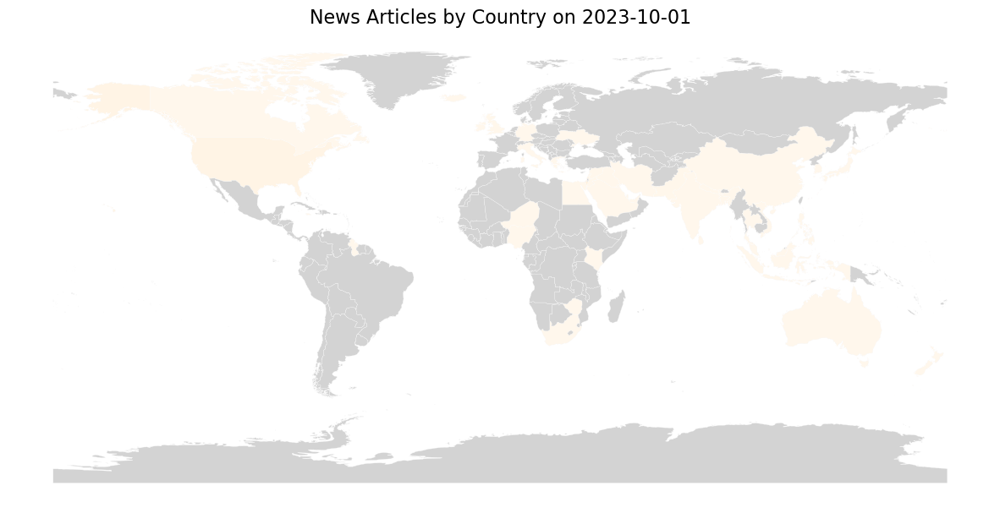

In [12]:
import os
import pycountry
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from cartopy.io.shapereader import natural_earth
from pyspark.sql.functions import col
import pandas as pd
import numpy as np

# 0) Prep output dir
os.makedirs("figures", exist_ok=True)

# 1) Filter & aggregate in Spark
df_filtered = (
    df_final
      .filter((col("SQLDATE") >= "2023-10-01") & (col("SQLDATE") <= "2024-03-31"))
)
daily_counts = (
    df_filtered
      .groupBy("SQLDATE", "news_source_country")
      .count()
      .filter(col("news_source_country").isNotNull())
)
pdf = daily_counts.toPandas()

# 2) Map names to ISO-3
def name_to_iso3(n):
    try:
        return pycountry.countries.lookup(n).alpha_3
    except:
        return None

pdf["iso_alpha"] = pdf["news_source_country"].apply(name_to_iso3)
pdf = pdf.dropna(subset=["iso_alpha"])

# 3) Pivot to dates × iso codes (zeros filled in)
pivot = pdf.pivot_table(
    index="SQLDATE",
    columns="iso_alpha",
    values="count",
    fill_value=0
)
dates = sorted(pivot.index)

# compute overall max for color‐scaling
max_count = pivot.values.max()

# 4) Load a higher‐res shapefile if you care about tiny islands; 50m picks up more than 110m:
shapefile = natural_earth(
    resolution="50m", category="cultural", name="admin_0_countries"
)
world = gpd.read_file(shapefile)
world = world.rename(columns={"ISO_A3": "iso_a3"})

# 5) Draw base map once
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.axis("off")
world.plot(ax=ax, color="lightgrey", edgecolor="white", linewidth=0.5)

# remember how many collections that base map added
base_col_count = len(ax.collections)

# prepare a fixed Normalize for consistent color‐scaling
norm = plt.Normalize(vmin=0, vmax=max_count)

# 6) Update func: overlay only >0, leave zeros transparent
def update(frame_date):
    # remove *only* last overlay(s)
    while len(ax.collections) > base_col_count:
        ax.collections[-1].remove()

    ax.set_title(f"News Articles by Country on {frame_date}", fontsize=16)

    day = pivot.loc[frame_date].reset_index()
    day.columns = ["iso_a3", "count"]
    merged = world.merge(day, on="iso_a3", how="left")

    # mask zeros so they aren’t plotted (they’ll show base grey)
    merged["count_pos"] = merged["count"].where(merged["count"] > 0, np.nan)

    # plot only positive counts
    merged.plot(
        column="count_pos",
        ax=ax,
        cmap="OrRd",
        norm=norm,
        legend=False,
        missing_kwds={"color": "lightgrey"},
        edgecolor="white",
        linewidth=0.2
    )

    # return the new artist(s) (helps if you ever switch on blitting)
    return ax.collections[base_col_count:]

# 7) Compute FPS (~3s total)
fps = max(1, int(len(dates) / 5))

# 8) Animate & save
anim = FuncAnimation(fig, update, frames=dates, repeat=False, blit=False)
writer = PillowWriter(fps=fps)
anim.save("figures/news_by_country_time.gif", writer=writer, dpi=150)


Saved animation to figures/news_by_country_time.gif


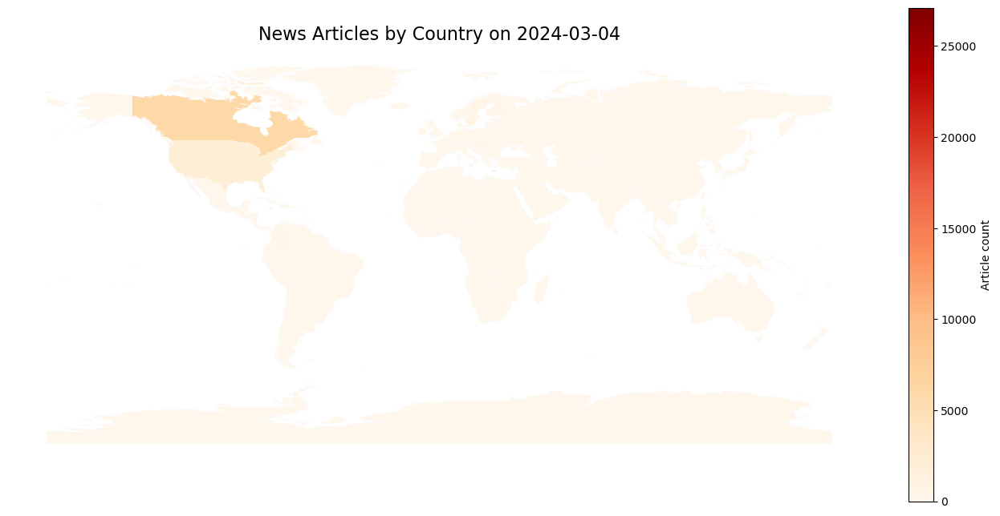

In [14]:
import os
import pycountry
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon as MplPolygon
from cartopy.io.shapereader import natural_earth
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
import pandas as pd
import numpy as np


df_filtered = (
    df_final
      .filter((col("SQLDATE") >= "2023-10-01") & (col("SQLDATE") <= "2024-03-31"))
      .filter(col("news_source_country").isNotNull())
)

daily_counts = (
    df_filtered
      .groupBy("SQLDATE", "news_source_country")
      .count()
)

pdf = daily_counts.toPandas()

# ─── 2) Map country names → ISO3 codes ────────────────────────────────────────
def name_to_iso3(n):
    try:
        return pycountry.countries.lookup(n).alpha_3
    except:
        return None

pdf["iso_alpha"] = pdf["news_source_country"].apply(name_to_iso3)
pdf = pdf.dropna(subset=["iso_alpha"])

# ─── 3) Pivot to date × ISO matrix ─────────────────────────────────────────────
pivot = pdf.pivot_table(
    index="SQLDATE",
    columns="iso_alpha",
    values="count",
    fill_value=0
)
dates = sorted(pivot.index)
max_count = pivot.values.max()

# ─── 4) Load country geometries ───────────────────────────────────────────────
shapefile = natural_earth(
    resolution="50m", category="cultural", name="admin_0_countries"
)
world = gpd.read_file(shapefile).rename(columns={"ISO_A3": "iso_a3"})

# ─── 5) Prepare figure & static base map ──────────────────────────────────────
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.axis("off")
world.plot(ax=ax, color="lightgrey", edgecolor="white", linewidth=0.5)

# ─── 6) Build one PatchCollection for all countries ───────────────────────────
# Normalize color scale across all frames
norm = plt.Normalize(vmin=0, vmax=max_count)

patches = []
for geom in world.geometry:
    if geom.geom_type == "MultiPolygon":
        for part in geom.geoms:
            coords = np.asarray(part.exterior.coords)
            patches.append(MplPolygon(coords))
    elif geom.geom_type == "Polygon":
        coords = np.asarray(geom.exterior.coords)
        patches.append(MplPolygon(coords))

overlay = PatchCollection(
    patches,
    cmap="OrRd",
    norm=norm,
    edgecolor="white",
    linewidth=0.2,
    zorder=2
)
# initialize all to zero
overlay.set_array(np.zeros(len(patches)))
ax.add_collection(overlay)

# add a colorbar
cbar = fig.colorbar(overlay, ax=ax, fraction=0.035, pad=0.04)
cbar.set_label("Article count")

# keep country ISO ordering for fast lookups
iso_order = world["iso_a3"].tolist()

# ─── 7) Animation update function ─────────────────────────────────────────────
def update(frame_date):
    ax.set_title(f"News Articles by Country on {frame_date}", fontsize=16)
    # grab that day's counts
    day = pivot.loc[frame_date].reset_index()
    day.columns = ["iso_a3", "count"]
    # map iso → count (0 if missing)
    counts = (
        day.set_index("iso_a3")
           .reindex(iso_order)
           .fillna(0)["count"]
           .values
    )
    # update the patch collection
    overlay.set_array(counts)
    return [overlay]

# ─── 8) Create & save animation ───────────────────────────────────────────────
fps = 5
anim = FuncAnimation(
    fig,
    update,
    frames=dates,
    interval=1000/fps,  # ms between frames
    blit=True,
    repeat=False
)

writer = PillowWriter(fps=fps)
anim.save("figures/news_by_country_time.gif", writer=writer, dpi=150)

print("Saved animation to figures/news_by_country_time_updated.gif")


In [21]:
import os
import matplotlib.pyplot as plt

# make sure output dir exists
os.makedirs("figures", exist_ok=True)

# define the regions you care about (in whatever exact case they appear in your PDF)
wanted = ["Europe", "USA", "Middle East"]

# filter your pandas DF
pdf_sel = pdf[pdf.region.isin(wanted)]

# plot
fig, ax = plt.subplots(figsize=(10, 6))
for region in wanted:
    sub = pdf_sel[pdf_sel.region == region]
    ax.plot(sub.date, sub.avg_tone, label=region)

ax.legend()
ax.set_xlabel("Date")
ax.set_ylabel("Average Tone")
ax.set_title("Sentiment over time by region")

plt.tight_layout()
# save to your figures folder
plt.savefig("figures/sentiment_by_region.png", dpi=150)
plt.show()


AttributeError: 'DataFrame' object has no attribute 'region'

In [22]:
from pyspark.sql.functions import expr

# Map QuadClass 1–4 into human-readable categories
df_typed = df_final.withColumn("event_type",
    expr("""
      CASE QuadClass
        WHEN '1' THEN 'Verbal Cooperation'
        WHEN '2' THEN 'Material Cooperation'
        WHEN '3' THEN 'Verbal Conflict'
        WHEN '4' THEN 'Material Conflict'
        ELSE 'Other'
      END
    """)
)

df_typed = df_typed.withColumn("polarity",
    expr("CASE WHEN GoldsteinScale > 0 THEN 'Positive' ELSE 'Negative' END")
)

from pyspark.sql.functions import avg

sent_by_type = (
  df_typed
    .groupBy("region", "event_type")
    .agg(avg("AvgTone").alias("avg_tone"))
    .orderBy("event_type", "region")
)

sent_by_type.show(truncate=False)


+-----------+--------------------+-------------------+
|region     |event_type          |avg_tone           |
+-----------+--------------------+-------------------+
|Europe     |Material Conflict   |-5.450861349580886 |
|Middle East|Material Conflict   |-5.8652864135464196|
|USA        |Material Conflict   |-5.335708429449226 |
|other      |Material Conflict   |-6.024077740517621 |
|Europe     |Material Cooperation|-4.158102188175027 |
|Middle East|Material Cooperation|-4.088712907606733 |
|USA        |Material Cooperation|-4.106843344251985 |
|other      |Material Cooperation|-4.171994519147434 |
|Europe     |Verbal Conflict     |-5.156202966640268 |
|Middle East|Verbal Conflict     |-5.347892782860458 |
|USA        |Verbal Conflict     |-4.962972231111446 |
|other      |Verbal Conflict     |-5.356555998839836 |
|Europe     |Verbal Cooperation  |-4.023013652261384 |
|Middle East|Verbal Cooperation  |-3.8772474177299086|
|USA        |Verbal Cooperation  |-3.922871663543027 |
|other    

In [23]:
from pyspark.sql.functions import col, avg, max, min, countDistinct, when

# Step 1: Prepare dataframe
df = df_final

# Step 2: Map QuadClass to meaningful descriptions
df = df.withColumn(
    "QuadClass_Description",
    when(col("QuadClass") == "1", "Verbal Cooperation")
    .when(col("QuadClass") == "2", "Material Cooperation")
    .when(col("QuadClass") == "3", "Verbal Conflict")
    .when(col("QuadClass") == "4", "Material Conflict")
    .otherwise("Unknown")
)

# Step 3: Compute average tone by region, domain_name, and QuadClass description
news_region_tone = (
    df.groupBy("region", "domain_name", "QuadClass", "QuadClass_Description")
      .agg(
          avg("AvgTone").alias("avg_tone"),
          countDistinct("GLOBALEVENTID").alias("num_events")
      )
)

# Step 4: Calculate polarization across news sources by region and QuadClass
polarization = (
    news_region_tone.groupBy("region", "QuadClass", "QuadClass_Description")
        .agg(
            max("avg_tone").alias("max_tone"),
            min("avg_tone").alias("min_tone"),
            (max("avg_tone") - min("avg_tone")).alias("polarization_range"),
            countDistinct("domain_name").alias("num_sources")
        )
        .filter(col("num_sources") > 1)  # Ensuring meaningful comparisons
        .orderBy(col("polarization_range").desc())
)

# Display clearly interpreted results
polarization.select(
    "region",
    "QuadClass",
    "QuadClass_Description",
    "max_tone",
    "min_tone",
    "polarization_range",
    "num_sources"
).show(truncate=False)


+-----------+---------+---------------------+------------------+-------------------+------------------+-----------+
|region     |QuadClass|QuadClass_Description|max_tone          |min_tone           |polarization_range|num_sources|
+-----------+---------+---------------------+------------------+-------------------+------------------+-----------+
|other      |1        |Verbal Cooperation   |20.011277302943988|-12.0523792937586  |32.063656596702586|1343       |
|other      |4        |Material Conflict    |8.87096774193548  |-18.1818181818182  |27.05278592375368 |1110       |
|USA        |3        |Verbal Conflict      |9.85915492957742  |-16.0              |25.85915492957742 |3487       |
|USA        |4        |Material Conflict    |6.9453809844909   |-17.8571428571429  |24.8025238416338  |3496       |
|USA        |2        |Material Cooperation |10.6542056074766  |-13.068181818181799|23.722387425658397|3354       |
|other      |3        |Verbal Conflict      |8.332612269620146 |-15.0166

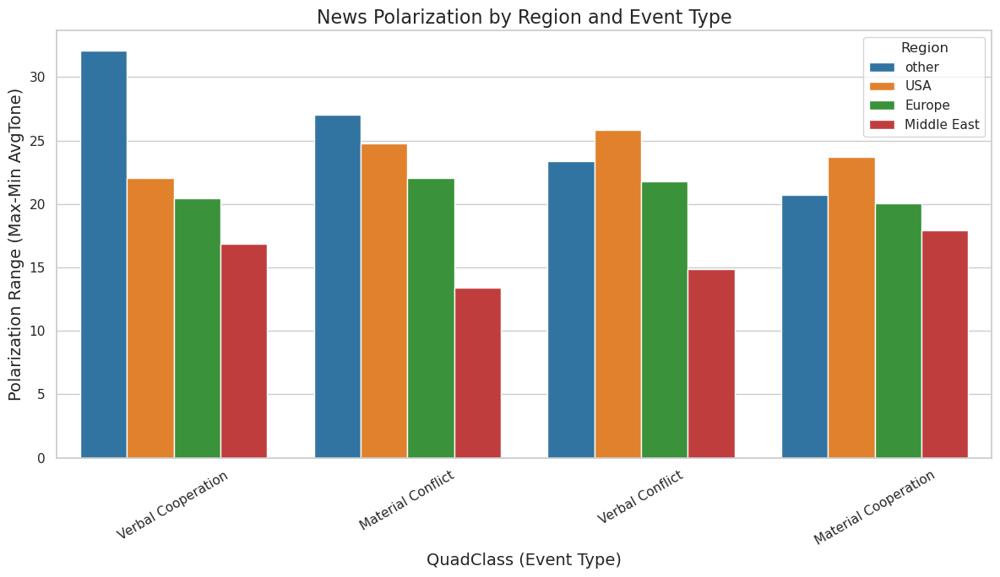

In [24]:
# Assuming you have already run the Spark code from earlier:
polarization_pd = polarization.select(
    "region",
    "QuadClass_Description",
    "polarization_range"
).toPandas()

import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the plot aesthetics
plt.figure(figsize=(12, 7))
sns.set(style="whitegrid")

# Create grouped bar plot
sns.barplot(
    data=polarization_pd,
    x="QuadClass_Description",
    y="polarization_range",
    hue="region",
    palette="tab10"
)

# Enhance plot readability
plt.title("News Polarization by Region and Event Type", fontsize=16)
plt.xlabel("QuadClass (Event Type)", fontsize=14)
plt.ylabel("Polarization Range (Max-Min AvgTone)", fontsize=14)
plt.xticks(rotation=30)
plt.legend(title="Region")

plt.tight_layout()
plt.show()


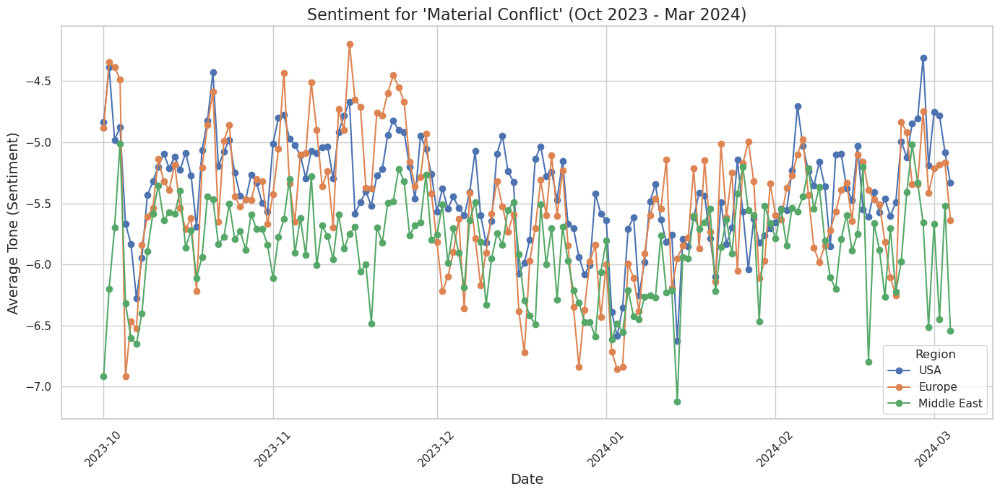

In [25]:
from pyspark.sql.functions import col, avg, to_date

# Filter for Material Conflict, specific regions, and date range
filtered_df = df_final.filter(
    (col("QuadClass") == "4") &
    (col("region").isin(["USA", "Europe", "Middle East"])) &
    (col("SQLDATE") >= "2023-10-01") &
    (col("SQLDATE") <= "2024-03-31")
)

# Compute average tone by date and region
time_series_df = (
    filtered_df
    .groupBy("SQLDATE", "region")
    .agg(avg("AvgTone").alias("avg_tone"))
    .orderBy("SQLDATE")
)

# Convert to Pandas for visualization
time_series_pd = time_series_df.toPandas()

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Ensure date is in datetime format
time_series_pd['SQLDATE'] = pd.to_datetime(time_series_pd['SQLDATE'])

# Pivot data for easy plotting
pivot_df = time_series_pd.pivot(index='SQLDATE', columns='region', values='avg_tone')

# Plot setup
plt.figure(figsize=(14, 7))
sns.set(style="whitegrid")

# Plot lines for each region
for region in ['USA', 'Europe', 'Middle East']:
    if region in pivot_df.columns:
        plt.plot(
            pivot_df.index,
            pivot_df[region],
            marker='o',
            label=region
        )

# Improve readability
plt.title("Sentiment for 'Material Conflict' (Oct 2023 - Mar 2024)", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Tone (Sentiment)", fontsize=14)
plt.legend(title="Region")
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()


## Advance Level EDA

In [3]:
from pyspark.sql.functions import col
from pyspark.ml.feature import VectorAssembler, StandardScaler, StringIndexer, OneHotEncoder
from pyspark.ml.clustering import KMeans
from pyspark.ml import Pipeline

# Step 0: Convert QuadClass to numeric
df_numeric = df_final.withColumn("QuadClass", col("QuadClass").cast("int"))

# Step 1: Index and encode categorical column 'region'
indexer = StringIndexer(inputCol="region", outputCol="region_index")
encoder = OneHotEncoder(inputCol="region_index", outputCol="region_vec")

# Step 2: Assemble features
assembler = VectorAssembler(
    inputCols=["AvgTone", "GoldsteinScale", "NumMentions", "NumSources", "QuadClass", "region_vec"],
    outputCol="features_raw"
)

# Step 3: Normalize
scaler = StandardScaler(inputCol="features_raw", outputCol="features")

# Step 4: KMeans model
kmeans = KMeans(k=4, seed=42, featuresCol="features", predictionCol="cluster")

# Step 5: Build pipeline
pipeline = Pipeline(stages=[indexer, encoder, assembler, scaler, kmeans])

# Step 6: Fit model and transform data
model = pipeline.fit(df_numeric)
clustered_df = model.transform(df_numeric)

# Step 7: Inspect clusters
clustered_df.select("SQLDATE", "region", "QuadClass", "AvgTone", "cluster").show()


+----------+-----------+---------+-----------------+-------+
|   SQLDATE|     region|QuadClass|          AvgTone|cluster|
+----------+-----------+---------+-----------------+-------+
|2023-11-30|        USA|        3| -6.1289726533629|      3|
|2023-11-30|        USA|        2|-5.74266111817431|      1|
|2023-11-30|        USA|        2|-5.74266111817431|      1|
|2023-11-30|        USA|        2|-5.74266111817431|      1|
|2023-11-30|        USA|        1| -6.1289726533629|      1|
|2023-11-30|        USA|        3| -6.1289726533629|      3|
|2023-11-30|        USA|        1| -6.1289726533629|      1|
|2023-11-30|        USA|        3| -6.1289726533629|      3|
|2023-12-07|Middle East|        1|-9.16530278232403|      2|
|2023-12-07|        USA|        3| 0.87591240875913|      3|
|2023-12-07|        USA|        4|-7.79465767537486|      3|
|2023-12-07|        USA|        2|-5.37532859844584|      1|
|2023-12-07|        USA|        2|-8.49947534102835|      1|
|2023-12-07|        USA|

In [ ]:
from pyspark.sql.functions import col

# Select only the needed columns
clustered_features = clustered_df.select("features", "cluster")

# Convert to Pandas
clustered_pd = clustered_features.toPandas()

import numpy as np

# Convert 'features' column to numpy arrays
features = np.array([np.array(row) for row in clustered_pd["features"]])
labels = clustered_pd["cluster"]

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Reduce to 2D with PCA
pca = PCA(n_components=2)
components = pca.fit_transform(features)

# Plot clusters
plt.figure(figsize=(10, 6))
plt.scatter(components[:, 0], components[:, 1], c=labels, cmap='viridis', alpha=0.7)
plt.title("K-Means Clusters (PCA-reduced)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()
